***

* [Outline](../0_Introduction/0_introduction.ipynb)
* [Glossary](../0_Introduction/1_glossary.ipynb)
* [5. Imaging](5_0_introduction.ipynb)  
    * Previous: [5.1 Spatial Frequencies](5_1_spatial_frequencies.ipynb)  
    * Next: [5.3 Gridding and Degridding for using the FFT](5_3_gridding_and_degridding.ipynb)

***

Import standard modules:

In [19]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Import section specific modules:

In [20]:
import matplotlib.image as mpimg
from IPython.display import Image, display, clear_output
from astropy.io import fits
import aplpy
import track_simulator
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import FloatSlider
from scipy.interpolate import griddata
from convolutional_gridder import grid_ifft
from AA_filter import AA_filter
#Disable astropy/aplpy logging
import logging
logger0 = logging.getLogger('astropy')
logger0.setLevel(logging.CRITICAL)
logger1 = logging.getLogger('aplpy')
logger1.setLevel(logging.CRITICAL)

In [21]:
from IPython.display import HTML, Javascript
HTML('../style/code_toggle.html')

***

## 5.2 采样和点扩展函数 Sampling and Point Spread Functions <a id='imaging:sec:samplingPSF'></a>

先讨论干涉测量和天空。我们可以把天空看成是一张“连续”图像，“连续”表示天空是空间连续的，这点跟数字图像不同，数字图像由空间上离散的像素构成。一个连续函数的傅立叶变换得到另一个连续函数，因此，在可见度域里有一些连续函数，它们是连续天空的傅立叶变换。由此引出，干涉阵测量（采样）的对象是连续可见度函数。这些测量结果，俗称“可见度”，能被用于重建出天空图像（至少部分天空图像），这种重建过程将贯穿本章。

For a moment let us discuss radio interferometry and the sky. We can think of the sky as being a 'continuous' image. What I mean by 'continuous' here is that the sky is spatial continuous, as opposed to a digital image which consists of spatially discrete pixels. The Fourier transform of a continuous function is another continous function. Thus, there is some continuous function in the visibility domain which is the Fourier transform of the continuous sky. As a hint of what is to come, we will see that an interferometric array measures, i.e. samples, the continuous visibility domain function. These measurements, colloquially called *visibilities*, can be used to reconstruct, at least partially, an image of the sky. The process of this reconstruction will be presented throughout this chapter. With that motivation let us return to the discussion at hand.

在5.1节的最后，我们看到，对空间频率域（可见度）随机采样，采样的数量很大程度上决定了重建出来的图像质量。即便没有采集到完整的信息，也能重建出很多图像。在本节，我们将沿着这一思路，说明不同的可见度采样会给重建图像带来哪些不同。

At the end of Section 5.1 we saw how the random sampling of the spatial frequency (visibility) domain reconstructs the original image to varying degrees of quality dependent on the number of samples used. Even without complete information, much of the original image can be recovered. In this section we will expand on that idea to show how different samplings of the visibility space will result in different characteristics in the image domain.

### 5.2.1 规则采样 Regular Sampling

用一个规则间隔函数（称为Shah函数，或Dirac comb函数，或针床函数bed of nails）对一个连续信号进行采样，是把一个连续信号转换成一个离散信号的常见方法，也叫数字化。以下是一维Shah函数[1-D Shah function &#10142;](../2_Mathematical_Groundwork/2_2_important_functions.ipynb#math:sec:shah_function)：

A standard method to convert a continuous signal into a discrete signal to apply a regularly-spaced function called a Shah (or Dirac comb, or bed of nails) function to the continous signal. This is equivalent to the concept of digitization. The [1-D Shah function &#10142;](../2_Mathematical_Groundwork/2_2_important_functions.ipynb#math:sec:shah_function) is

$$\operatorname{III}_a(x) = \sum_{n=-\infty}^{+\infty} \delta(x+an)$$

其中$\delta(x)$ 为Dirac Delta函数，$a$为比例系数，用来确定采样宽度，或采样间隔，采样频率。因此，利用Shah函数，一个连续函数$f(x)$被采样成了一个离散函数$f_n(x)$

where $\delta(x)$ is the Dirac Delta function and $a$ is a scaling factor to set the width between samples. Thus, a continuous function $f(x)$ can be sampled with the Shah function to produce a discrete function $f_n(x)$

$$f_n(x) = \operatorname{III}_a(x)\,\,f(x) = \sum_{n=-\infty}^{+\infty} f(x)\,\,\delta(x+an)$$

Text(0.5,1,'Discrete Functions $f_n(X)$')

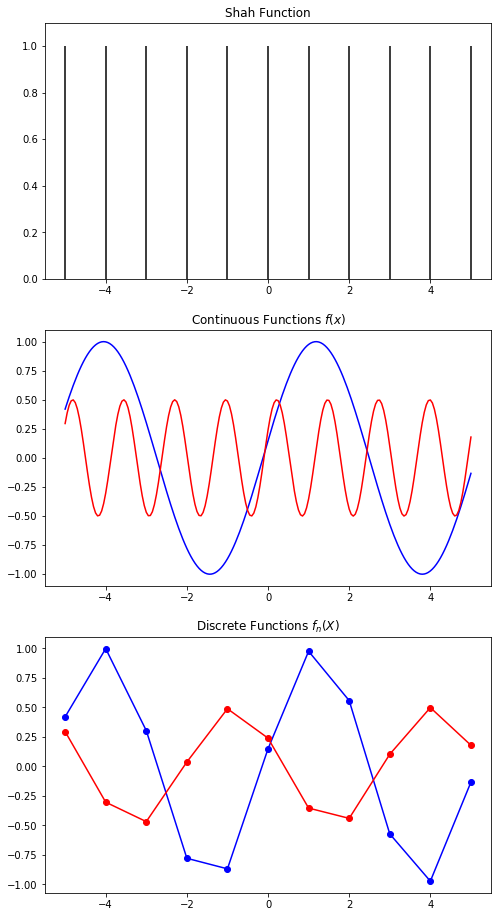

In [22]:
xpos = np.linspace(-5, 5, num=200+1)
shah = np.where(xpos.astype(int)==xpos, 1, 0)

fig, axes = plt.subplots(figsize=(8,16))

plt.subplot(3,1,1)
plt.vlines(xpos[np.argwhere(shah > 0)], 0, 1)
plt.ylim(0, 1.1)
plt.title('Shah Function')

plt.subplot(3,1,2)
cont0 = np.sin(1.2 * xpos + 0.15)
cont1 = 0.5 * np.sin(5 * xpos + 0.5)
plt.plot(xpos, cont0, 'b-')
plt.plot(xpos, cont1, 'r-')
plt.title('Continuous Functions $f(x)$')

plt.subplot(3,1,3)
discrete0 = shah * cont0
discrete1 = shah * cont1
plt.plot(xpos[np.argwhere(np.abs(shah) > 0)], discrete0[np.argwhere(np.abs(shah) > 0)], 'bo-')
plt.plot(xpos[np.argwhere(np.abs(shah) > 0)], discrete1[np.argwhere(np.abs(shah) > 0)], 'ro-')
plt.title('Discrete Functions $f_n(X)$')


*图：用Shah函数或者Dirac comb函数对连续信号进行采样的结果。上：Shah函数，采样系数$a=1$，因此Nyquist限制，即最高信号频率为$2a = 2$；中：连续正弦函数，频率分别为1.2（蓝色）和5（红色）；下：经过Shah函数采样的离散正弦函数，蓝色正弦波的频率为$1.2 \le 2$，因此采样充分；红色正弦波频率为$5 > 2$，因此采样不足。Figure: the effect of applying a Shah or Dirac Comb to a continuous signal. Top: the Shah function with a scaling factor of $a=1$, thus the Nyquist limit is $2a = 2$. Middle: a continuous Sine function with a frequency of $1.2$ (blue) and $5$ (red). Bottom: The discrete Sine functions after sampling by the Shah function. Since the blue Sine wave rate $1.2 \le 2$, the function is sufficiently sampled, but the red Sine wave is $5 > 2$ the function is aliased to a lower frequency.*

应用Shah函数对一个连续信号进行采样，得到的离散信号的带宽服从于奈奎斯特率，即$2a$。高于$2a$的采样将产生冗余频率，即过采样。关于采样理论的详细讨论可以参考[$\S$ 2.9 &#10142;](../2_Mathematical_Groundwork/2_9_sampling_theory.ipynb)。

The effect of applying a Shah function to sample a continuous signal is that the now discretely sampled signal is bandlimited to a Nyquist rate of $2a$. Periodic signals with rates larger than $2a$ will be aliased to lower frequencies. See [$\S$ 2.9 &#10142;](../2_Mathematical_Groundwork/2_9_sampling_theory.ipynb) for a detailed discussion on sampling theory.

以上公式可以很容易地扩展到高维，比如二维的Shah函数：

This formulation is easily extended to higher dimensions, for example the 2-D Shah function is

$$\operatorname{III}_{a,b}(x, y) = \sum_{n=-\infty}^{+\infty} \sum_{m=-\infty}^{+\infty} \delta(x+an, y+bm)$$

我们可以用上述功能将连续的天空图像采样为数字图像，如带CCD的望远镜。但是，在射电天文领域，受限于规模、技术以及灵敏度等诸多因素，这是难以实现的。相反，我们要使用不规则的采样方法。

We can use this function to sample a continuous sky image into a digital image, such as is done with a telescope and CCD camera. But, in radio astronomy that is not possible due to a number of issues with scale, technology, and sensitivity. Instead, we use an irregular sampling method. 

### 5.2.2 广义采样函数  A Generalized Sampling Function

规则采样函数是广义采样函数的一个特例，只发生在采样间隔一致的情况下。然后，我们将看到，在干涉测量领域，规则采样非常罕见。干涉测量领域的采样函数属于广义采样函数，跟阵列的布局、观测带宽、天空指向以及数据标定等诸多因素有关。广义的2-D采样函数是$Q$组$(x_i, y_i)的任意集合，其中i \le Q$：

Regular sampling functions are a special case of the general sampling function which happen to be equally spaced in sampling postion. But, as we will see, regular sampling is a rare case in interferometry. Instead, the sampling functions will be a function of the interferometric array configuration, observation bandwidth, sky pointing direction, and data flagging among other issues. The general 2-D sampling function form an arbitrary set of $Q$ pairs $(x_i, y_i), i \le Q$

$$S(x, y) = \sum_{i=1}^{Q} \delta(x+x_i, y+y_i)$$

对该公式进一步泛化，得到一个“权重采样函数weighted sampling function”：

This equation can be further generalized to a *weighted sampling function*

$$S(x, y) = \sum_{i=1}^{Q} w_i \,\, \delta(x+x_i, y+y_i)$$

在上式中，对每个采样赋予权重，例如，对于一个噪声系统来说，可以用权重标明采样的可靠性。我们后面将看到，权重还可以用来调整图像的响应，但这已经超出了我们的讨论范围。

Which can be used to weight individual samples, for example the weight can indicate the reliability of the sample in a noisy system. Or, as we will see, this weight is used to shape the resulting image response, but that is getting ahead of ourselves.

用一个广义权重2-D采样函数对一个连续信号进行采样：

The general weighted 2-D sampling function applied to a continuous signal is

$$f(X, Y) = S(x, y) \,\, f(x,y) = \sum_{i=1}^{Q} w_i \,\, \delta(x+x_i, y+y_i) \,\, f(x, y)$$

采样使得我们失去了部分信息，因为我们只测量了部分信号。下一步我们将学习到，不同的采样函数对复原图像的影响，尤其是当我们在空间频率域（可见度）采样时，采样函数对复原得到的空域图像的影响。

By sampling a function we are inherently losing information as we are only measuring part of a signal. The next step is to understand how our choice of sampling effects what we can recover, especially when we are sampling in the spatial frequency (visibility) domain to recover an image in the spatial (image) domain.

### 5.2.3 点扩散函数（PSF）The Point Spread Function (PSF)

在天文和摄影界有一个“点扩散函数”的术语，该术语指的是测量系统对理想点源的响应。在光学天文学领域，恒星通常被认为是不可解析的（unresolved），因为望远镜的分辨率不足以测量出恒星的角尺寸。所以，恒星可以看成是一个理想的点源，而望远镜的光学系统则是在强点源的图像上增加了结构。

The term *Point Spread Function* comes up in a lot of astronomy and photography, the term refers to the response of a measurement system to perfect point source. In optical astronomy stars are usually 'unresolved', that is the resolution of the telescope is insufficient to measure the angular size of the star. So, a star can effectively be considered a point source. The optics of the telescope then impose a structure on the entire image which can be seen in strong point sources.

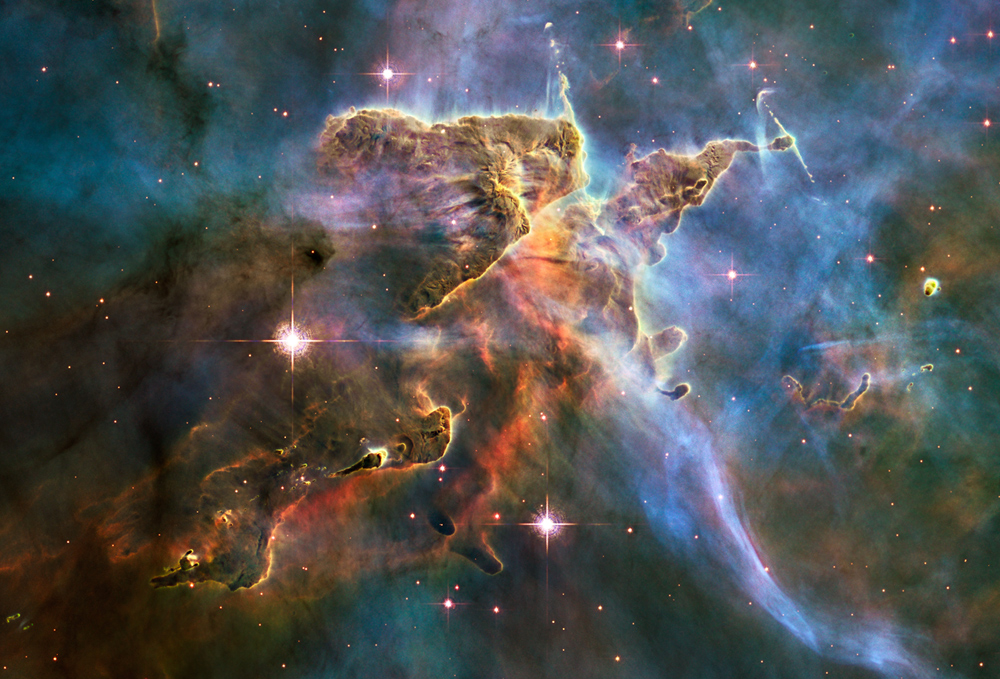

In [23]:

Image(filename='figures/hs-2010-13-g-large_web.jpg')



# carina = mpimg.imread('figures/hs-2010-13-g-large_web.jpg')
# fig = plt.figure(figsize=(8,8))
# plt.title('Carina Nebula image')
# plt.imshow(carina)



*图：哈勃望远镜拍摄的船底座星云，前景中恒星的十字纹和艾里斑，就是望远镜光学系统的点扩散函数。Figure: Carina Nebula image from the Hubble Telescope, the cross pattern and airy pattern from the stars in the foreground is the point spread function of the telecsope due to the optics.*
[Credit: NASA, ESA, and M. Livio and the Hubble 20th Anniversary Team (STScI)](http://hubblesite.org/gallery/album/star/pr2010013g/)

射电天文学有两类PSF。第一类跟光学天文一样，是光学结构对点源产生对响应，这种PSF跟天线的波束有关，目前可以忽略。第二类PSF跟阵列的布局结构有关，而阵列的布局结构决定了对可见度域的采样，在讨论射电干涉测量时，所提到的PSF指的就是这一类型。目前，我们只是简单认为，干涉测量阵列的PSF（事实上对任何望远镜都一样）就是可见度域采样函数的傅立叶变换。

In radio astronomy there are two types of PSFs, the first is the same as in optical astronomy where the shape of the optics imposes a response to a point source. This is PSF relates to the antenna beam and can be ignored for now. When discussing radio interferometry the term PSF relates to the geometry of the array configuration, that is how the array *samples* the visibility domain. For the moment we will simply state that the PSF of an interferometric array (in fact any telescope) is the Fourier transform of the visibility domain sampling function.

$$\text{PSF}(l,m) \rightleftharpoons S(u,v)$$

在可见度域，我们用$u$和$v$描述位置，术语$uv$-space指的就是可见度域。图像域的位置用$l$ 和 $m$表示，范围为 $-1 \le l,m \le 1$ ([$\S$ 3.4 &#10142;](../3_Positional_Astronomy/3_4_Direction_Cosine_Coordinates.ipynb))。这些术语在 [Visibility Space &#10142;](../4_Visibility_Space/4_0_introduction.ipynb)有详细介绍。跟笛卡尔坐标系一样，图像域和可见度域的原点$(0,0)$都位于中心。历史文献中经常使用的术语“波束合成synthesized beam”，指的就是PSF。

To add some interferometry specific notation we describe positions in the visibility domain in terms of $u$ and $v$, the term $uv$-space is often used as a synonym for the visibility domain. Positions in the image domain are denoted with $l$ and $m$, both of which range $-1 \le l,m \le 1$ ([$\S$ 3.4 &#10142;](../3_Positional_Astronomy/3_4_Direction_Cosine_Coordinates.ipynb)). These terms are more fully described in the  [Visibility Space &#10142;](../4_Visibility_Space/4_0_introduction.ipynb) chapter. For both the image and visibility domain $(0,0)$ is at the centre like a Cartesian coordinate system. In historical literature the term *synthesized beam* is often used, this is equivalent to the PSF.

系统的测量结果，即“观测信号”，是“真实信号”跟系统的PSF的卷积：

The resulting *obsvered signal* from a measurement system is the convolution of the *true signal* with the PSF of the system

$$I_{obs} = \text{PSF} \circ I_{true} $$

这里，我们将略过复杂的数学推导，不深究为什么PSF和采样函数之间存在傅立叶关系，也不讨论观测图跟真实图之间的关系，而是给出几个简单的采样函数的例子，看看其生成的PSF以及对图像的影响。

For the moment, we will skip the mathematical complexities of why the PSF and sampling functions are Fourier pairs, and the relations between the observed and true images. Instead, we will graphically look at some examples of simple sampling functions, what type of PSF is produced and how it affects an image.

沿用前一节例子里的图像，简单起见，把RGB图转换成灰度图：

We will continue to use the same example images from the previous section, and for simplicity convert the RGB-color images to grayscale:

In [24]:
#soccer = mpimg.imread('figures/WLA_moma_Umberto_Boccioni_Dynamism_of_a_Soccer_Player_1913_512.png')
cyclist = mpimg.imread('figures/Umberto_Boccioni_Dynamism_of_a_Cyclist_512.png')
duck = mpimg.imread('figures/Anas_platyrhynchos_male_female_quadrat_512.png')

def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b #standard grayscale conversion
    return gray

gCyclist = rgb2gray(cyclist)
gDuck = rgb2gray(duck)

可以想象，最简单的望远镜就是一个把光折射到探测面的圆孔，这种折射式望远镜最早由伽利略设计。望远镜的最大分辨率由孔径确定，孔径的二维切面是一个圆，即采样函数。透镜范围内的光能看到，透镜范围外的光看不到。该望远镜的采样函数是一个二进制圆。

The most simple telescope we can imagine is a circular aperture which refracts light to a measurement plane, this is a refracting telescope in the style of Galileo's original design. The aperture, which has a certain circumference defines the maximum resolution of the telescope and the 2-D cross section of the aperture, a disk, is the 'sampling' function. That is, all light within the circumference of the lense is seen, and all light beyond the lense is excluded. The sampling function of this telescope is a binary disk.

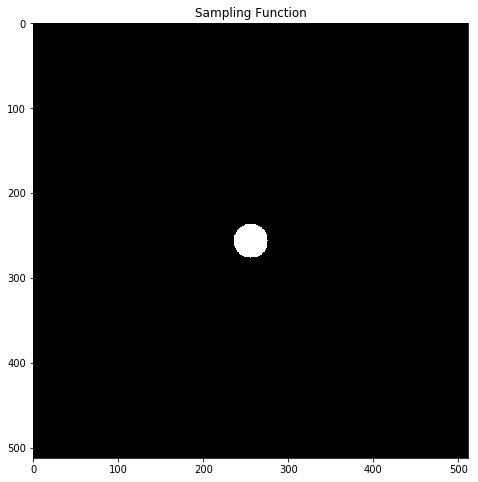

In [25]:
def circularSamplingMap(imgSize, outer, inner=0):
    """Return a circular sampling map of size [imgSize, imgSize]
    imgSize: image size in pixels
    outer: outer radius (in pixels) to exclude sampling above
    inner: inner radius (in pixels) to exclude sampling below"""
    zeros = np.zeros((imgSize,imgSize), dtype='float')
    ones = np.ones((imgSize,imgSize), dtype='float')
    xpos, ypos = np.mgrid[0:imgSize,0:imgSize]
    radius = np.sqrt((xpos - imgSize/2)**2. + (ypos - imgSize/2)**2.)
    sampling = np.where((outer >= radius) & (radius >= inner), ones, zeros)
    return sampling

sampling = circularSamplingMap(512, 20, 0)
fig, axes = plt.subplots(figsize=(8,8))
samplingPlot = plt.imshow(sampling)
plt.title('Sampling Function')
samplingPlot.set_cmap('gray')

*图：一个简单折射式望远镜的采样函数。Figure: sampling function of a simple refractor telescope.*

用傅立叶变换计算得到望远镜的PSF。

We can then compute the PSF of this telescope using a Fourier transform.

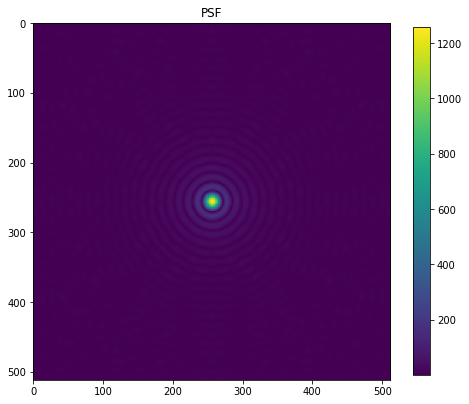

In [26]:
fig, axes = plt.subplots(figsize=(8,8))
psfPlot = plt.imshow(np.abs( np.fft.fftshift( np.fft.fft2(sampling))))
plt.title('PSF')
plt.colorbar(shrink=0.8)

*图：一个简单的圆采样函数的PSF，也被称为艾里斑。Figure: the PSF of a simple circular sampling function, this is also called an Airy disk.*

观察上图中的PSF，中央有一个峰（幅度），周围是一圈圈幅度逐级下降的环，这就是所谓的艾里班（Airy disk，也被称为一类贝塞尔Bessel函数，或径向对称辛格Sinc函数），它是一个径向对称礼帽函数（即我们之前构造的采样函数）的傅立叶变换。中心的峰常被称为PSF的“主瓣primary lobe”，其余的次级峰（即周围的环）是PSF的“旁瓣sidelobes”

Looking at the PSF there is large (in amplitude) central peak surrounding by rings which drop off in amplitude. This is known as an Airy disk (also called a Bessel function of the first kind, or radially symetric Sinc function), and is the Fourier transform of a radially symetric top-hat function which is what our simple sampling function is. The central peak is often called the *PSF primary lobe* and the secodary peaks, such as the rings, are the PSF *sidelobes*.

前面说过PSF是测量系统对一个点源的响应。然而，我们看到本例中的点源是一个艾里斑，其主瓣含有很多个像素。回头看前面这张哈勃望远镜拍的船底座星云图，其中几个亮源周围呈现艾里斑结构，并且有十字纹。

Remember, the PSF is the response of the measuring system to a point source, in this example we see that a point source will appear to be an Airy disk with a primary lobe of many pixels in size. Looking back at the Hubble image we can see that some of the bright sources have an AIry disk structure around them along with the cross patterns.

根据卷积定理，即一个域中两个函数的卷积是其傅立叶域的乘积([$\S$ 2.5 &#10142;](../2_Mathematical_Groundwork/2_5_convolution.ipynb))，我们生成前一节的鸭子图像的观测图像。

We can produce the observed image of the duck image from the previous section by taking advantage of the Fourier relation in the convolution theorem that a convolution of two function in one domain is a multiplication of those functions in the Fourier domain ([$\S$ 2.5 &#10142;](../2_Mathematical_Groundwork/2_5_convolution.ipynb)).

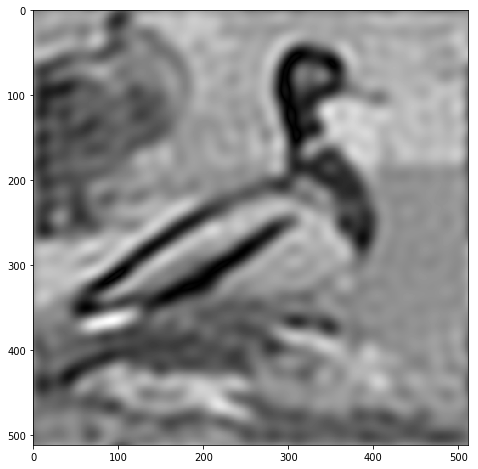

In [27]:
fftDuck = np.fft.fftshift(np.fft.fft2(gDuck)) #Fourier transform the duck to the spatial frequency domain
obsDuck = np.abs(np.fft.ifft2(np.fft.fftshift(sampling * fftDuck))) #multiple by the sampling function, and
                                                                    #Fourier transfrom back to the image domain
fig, axes = plt.subplots(figsize=(8,8))
obsPlot = plt.imshow(obsDuck)
obsPlot.set_cmap('gray')

*图：被采样后的鸭子观测图。Figure: the obsevred image of the duck using the sampling function presented above.*

生成的观测图非常模糊，这是因为较大的PSF主瓣有效地充当了低通滤波器，滤除了原图中的细节。通过增大采样函数的半径，即加大望远镜的孔径，则相应的PSF主瓣变小，我们因此获得了更高分辨率的望远镜。

The observed image is quite blurry as the large PSF primary lobe affectively acts as a low-pass filter to remove the fine details. By increasing the radius of the sampling function, i.e. using a larger telescope, we see that the PSF primary lobe gets smaller, and thus we have a higher resolution telescope as expected.

Text(0.5,1,'Observed Image')

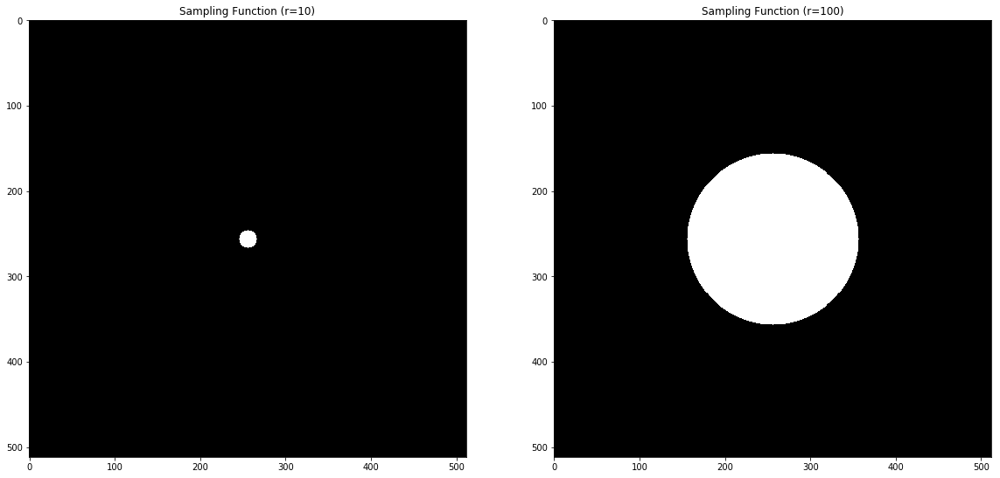

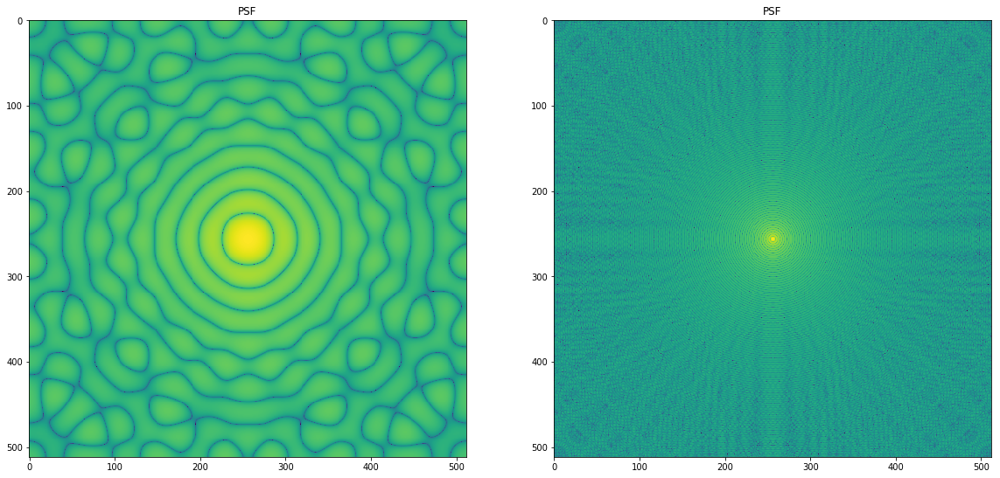

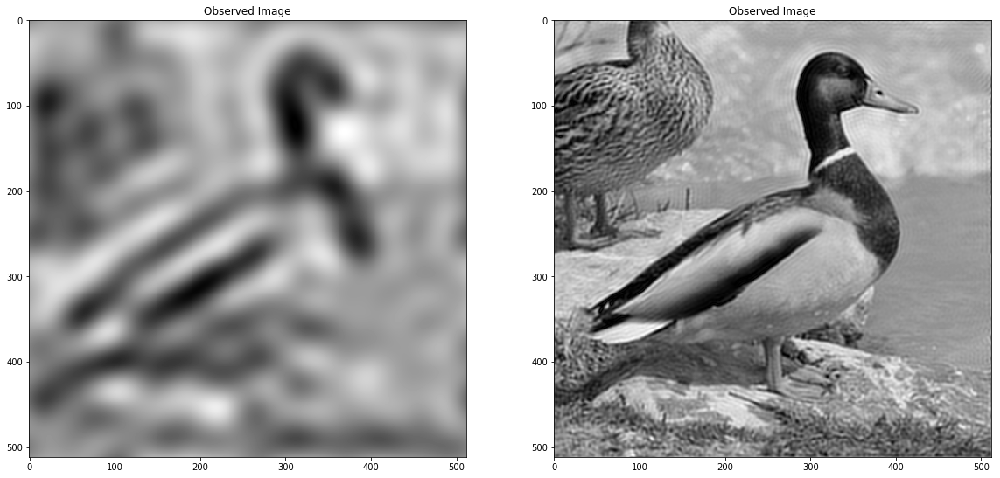

In [98]:
fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
sampling0 = circularSamplingMap(512, 10, 0)
samplingPlot = plt.imshow(sampling0)
samplingPlot.set_cmap('gray')
plt.title('Sampling Function (r=%i)'%10)

plt.subplot(1,2,2)
sampling1 = circularSamplingMap(512, 100, 0)
samplingPlot = plt.imshow(sampling1)
samplingPlot.set_cmap('gray')
plt.title('Sampling Function (r=%i)'%100)

fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
psfPlot = plt.imshow(np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling0)))))
plt.title('PSF')

plt.subplot(1,2,2)
psfPlot = plt.imshow(np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling1)))))
plt.title('PSF')

fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
obsDuck = np.abs(np.fft.ifft2(np.fft.fftshift(sampling0 * fftDuck)))
obsPlot = plt.imshow(obsDuck)
obsPlot.set_cmap('gray')
plt.title('Observed Image')

plt.subplot(1,2,2)
obsDuck = np.abs(np.fft.ifft2(np.fft.fftshift(sampling1 * fftDuck)))
obsPlot = plt.imshow(obsDuck)
obsPlot.set_cmap('gray')
plt.title('Observed Image')

*图：采样函数（上），PSFs（中），观测图像（下）。采样函数半径越大，则PSF响应越小，图像的分辨率越高。Figure: sampling functions (top row), resulting PSFs (middle row), and observed images (bottom row). A larger radius sampling function results in a smaller PSF response, which can be interpreted as higher resolution.*

可以看出，右边的采样半径较大，左边的采样半径较小，左边的图像比较模糊，分辨率较低。右边的采样函数依然没有完整覆盖可见度域，因此右图中能看到“振铃ringing”效应，特别是鸭子边缘，这是由PSF的旁瓣效应所致。

From the left column we can see that a small disk results in a blurred out, or low resolution, image compared to the larger sampling disk in the right column. Because the right column sampling fuction does not fully sample the visibility domain a 'ringing' can be seen in the observed image, especially around the edge of the duck, due to the PSF sidelobes.

现代望远镜大多用反射镜来取代透镜，因此望远镜的艾里班更为复杂。反射式望远镜的结构会遮挡部分孔径，比如焦点支撑和工程钻孔，相应的，采样函数的形状更复杂。接下来，让我们讨论天文中常见的环形采样函数。

Modern telescopes are not as simple as the refactor telescope-Airy disk relation as most are some form of reflector mirror instead of lense. Most have structures which block part of the aperture, such as struts to hold up equipment at the focus, or holes due to engineering constraints. We can expand on our simple sampling function to more complex shapes. Lets take a small step towards complexity by making a ring sampling function, which is fairly common in astronomy.

(-1.1368683772161603e-12+0j)

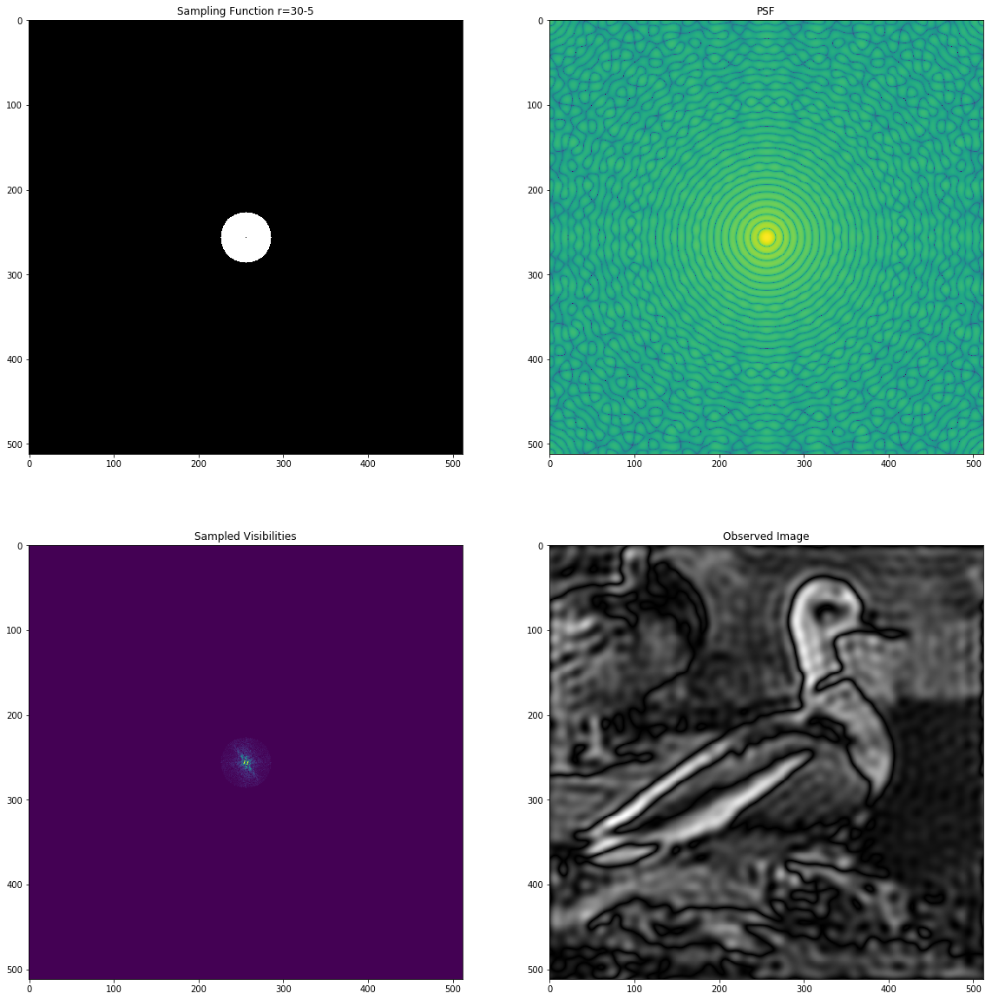

In [96]:
fig, axes = plt.subplots(figsize=(16,16))
fig.tight_layout()

plt.subplot(2,2,1)
sampling = circularSamplingMap(512, 30, 1)
samplingPlot = plt.imshow(sampling)
samplingPlot.set_cmap('gray')
plt.title('Sampling Function r=30-5')

plt.subplot(2,2,2)
psfPlot = plt.imshow( np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
#psfPlot = plt.imshow(np.abs( np.fft.fftshift( np.fft.fft2(sampling))))
plt.title('PSF')

plt.subplot(2,2,3)
samplingPlot = plt.imshow(np.abs(sampling * fftDuck))
plt.title('Sampled Visibilities')

plt.subplot(2,2,4)
obsDuck = np.abs(np.fft.ifft2(np.fft.fftshift(sampling * fftDuck)))
obsPlot = plt.imshow(obsDuck)
obsPlot.set_cmap('gray')
plt.title('Observed Image')


#The sum of the observed image components is approximately zero
np.sum(np.fft.ifft2(np.fft.fftshift(sampling * fftDuck))) 


*图：对空间频率域进行有限采样所生成的观测图像。左上：环形采样；右上：采样函数的PSF；左下：采样可见度的幅值；右下：采样可见度的傅立叶变换，即观测图像。Figure: The effect of sampling a limited set of spatial frequency domain components to produce an observed image. Top left: ring sampling function, Top right: resulting PSF of the sampling function, Bottom left: the amplitude of the sampled visibilities, Bottom right: the Fourier transform of the sampled visibilities, the observed image.*

环形采样函数可以看成是由两个采样函数构成，一个圆形的“正”采样函数对应一个艾利斑，另一个小的、套在里面的“负”采样函数，对应一个大些的艾利斑，这两个斑相减，得到右上图中的PSF。可以看出，该PSF的旁瓣总体较暗且径向上的亮度呈周期性变化。右下方的观测图能看出鸭子的形状，但是跟前面用完整圆形采样函数得到图又有所不同。现在的采样函数的半径虽然大了20个像素，但是中间的半径为5个像素范围内的可见度函数没有被采样到，而中央区域的可见度代表了原图的大尺度结构，因此，最终所获得的观测图的各像素之和为零。在空间频率域，$(0,0)$位置的采样经常被称为DC分量（源于信号处理的“直流direct current），代表了图像的均值。如果没有该位置的采样，则从余下的可见度分量所获得图像各像素之和将接近于零。

A ring sampling function can be thought of as being made up of two sampling functions, a circular 'positive' sampling function which results in an Airy disk, and small 'negative' circular sampling function, the inner section, which results in a larger Airy disk which is subtracted from the 'positive' sampling function. The resulting PSF can be seen to have sidelobes that dim but periodically brighten in radius. The observed image has a duck-like shape but is different from the first observed image we produced when the sampling function was a complete circle out to a radius of 20 pixels. We have dropped the inner 5 pixel radius visibility samples. The sum of the observed image is effectively zero, this is because the inner components represent the large scale structure of the image. For example, the sample at $(0,0)$ in the spatial frequency domain is often called the DC component (this comes from 'direct current' in signal processing) and represents the average of the image. By not sampling that component, the remaining image visibility components, when summed should be approximately zero.

环形采样相当于一个带通滤波器，它滤除了半径小于5而大于30的所有空间频率分量。接下来，我们生成一个半径更大的环形采样函数，并对上面的鸭子图进行带通滤波。

This ring sampling effectively acts as a bandpass filter which removes spatial frequency components that in the radius below 5 pixels and above 20 pixels. Creating another ring sampling function with a larger radius produces a different bandpass filter of the true image. 

Text(0.5,1,'Observed Image')

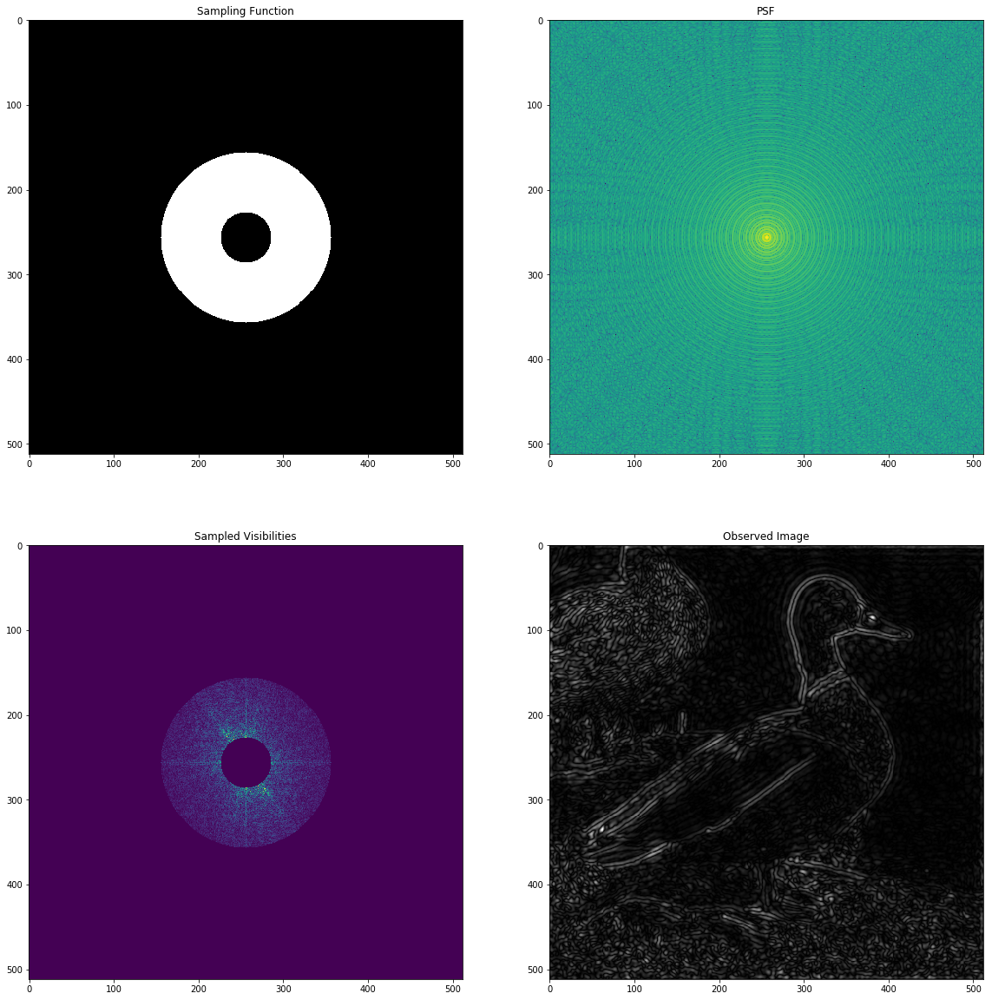

In [31]:
fig, axes = plt.subplots(figsize=(16,16))
fig.tight_layout()

plt.subplot(2,2,1)
sampling = circularSamplingMap(512, 100, 30)
samplingPlot = plt.imshow(sampling)
samplingPlot.set_cmap('gray')
plt.title('Sampling Function')

plt.subplot(2,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('PSF')

plt.subplot(2,2,3)
samplingPlot = plt.imshow(np.abs(sampling * fftDuck))
plt.title('Sampled Visibilities')

plt.subplot(2,2,4)
obsDuck = np.abs(np.fft.ifft2(np.fft.fftshift(sampling * fftDuck)))
obsPlot = plt.imshow(obsDuck)
obsPlot.set_cmap('gray')
plt.title('Observed Image')

*图：对空间频率域进行有限采样所生成的观测图像。左上：环形采样；右上：采样函数的PSF；左下：采样可见度的幅值；右下：采样可见度的傅立叶变换，即观测图像。：Figure: The effect of sampling a limited set of spatial frequency domain components to produce an observed image. Top left: ring sampling function, Top right: resulting PSF of the sampling function, shown in decibels, Bottom left: the amplitude of the sampled visibilities, Bottom right: the Fourier transform of the sampled visibilities, the observed image.*

可以看出，随着环形采样半径变宽，鸭子的细节变得丰富，鸭子的羽毛开始出现，而图像的分量之和仍然近似为零。

With a wider ring radius the finer details of the duck appear, some of the feathers of the duck in the background appear, the sum of the image components is still approximately zero.

Text(0.5,1,'Observed Image')

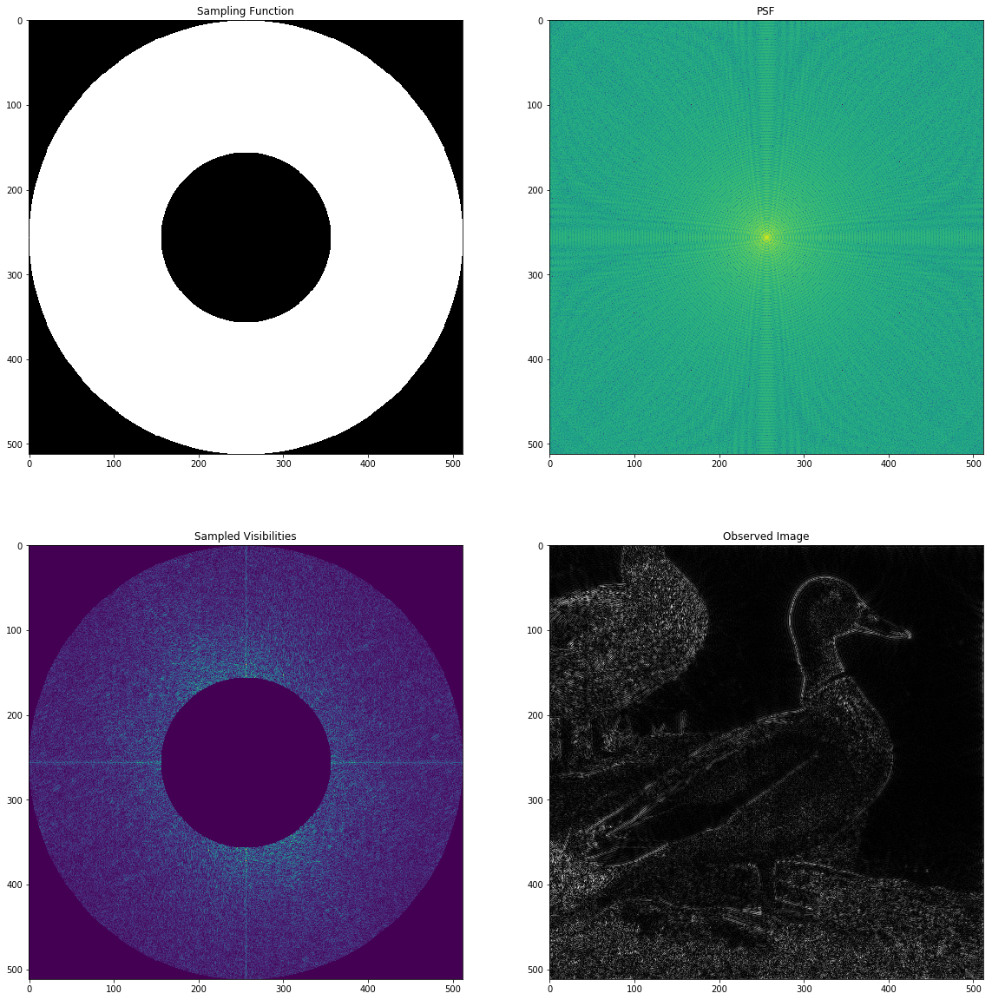

In [100]:
fig, axes = plt.subplots(figsize=(16,16))
fig.tight_layout()

plt.subplot(2,2,1)
sampling = circularSamplingMap(512, 256, 100)
samplingPlot = plt.imshow(sampling)
samplingPlot.set_cmap('gray')
plt.title('Sampling Function')

plt.subplot(2,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('PSF')

plt.subplot(2,2,3)
samplingPlot = plt.imshow(np.abs(sampling * fftDuck))
plt.title('Sampled Visibilities')

plt.subplot(2,2,4)
obsDuck = np.abs(np.fft.ifft2(np.fft.fftshift(sampling * fftDuck)))
obsPlot = plt.imshow(obsDuck)
obsPlot.set_cmap('gray')
plt.title('Observed Image')

*图：对空间频率域进行有限采样所生成的观测图像。左上：环形采样；右上：采样函数的PSF；左下：采样可见度幅值；右下：采样可见度的傅立叶变换，即观测图像。Figure: The effect of sampling a limited set of spatial frequency domain components to produce an observed image. Top left: ring sampling function, Top right: resulting PSF of the sampling function, shown in decibels, Bottom left: the amplitude of the sampled visibilities, Bottom right: the Fourier transform of the sampled visibilities, the observed image.*

进一步加宽环形采样函数的半径，观测图中的精细结构显现出来，但是图像依然很暗，因为图像的大多数能量集中在较低频的区域。根据以上的例子，我们得到一个直观的结论，对于大多数图像来说，其低频分量代表了图像的大多数信息，同时，可见度空间中环的半径越大，可能容纳的方向越多，能量越分散，对应了更高的分辨率。

Going to an even larger radius the finest details show up in the observed image, but is fairly faint because most the power is represented in the lower spatial frequencies, thus we have also increased the total sampling area. The intuition here is that in most images the the lower spatial freqeuncy components represent most of the information in the image, and at each successively larger ring in visibility space that are more possible orientations, i.e. higher resolution, for the power to be spread over.

接下来，让我们生成各种不同形状采样函数的PSF。

We can generate the resulting PSFs for a collection of different shapes.

/Users/denghui/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()
/Users/denghui/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log10
/Users/denghui/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:53: RuntimeWarning: divide by zero encountered in log10
/Users/denghui/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:69: RuntimeWarning: divide by zero encountered in log10


Text(0.5,1,'PSF (dB)')

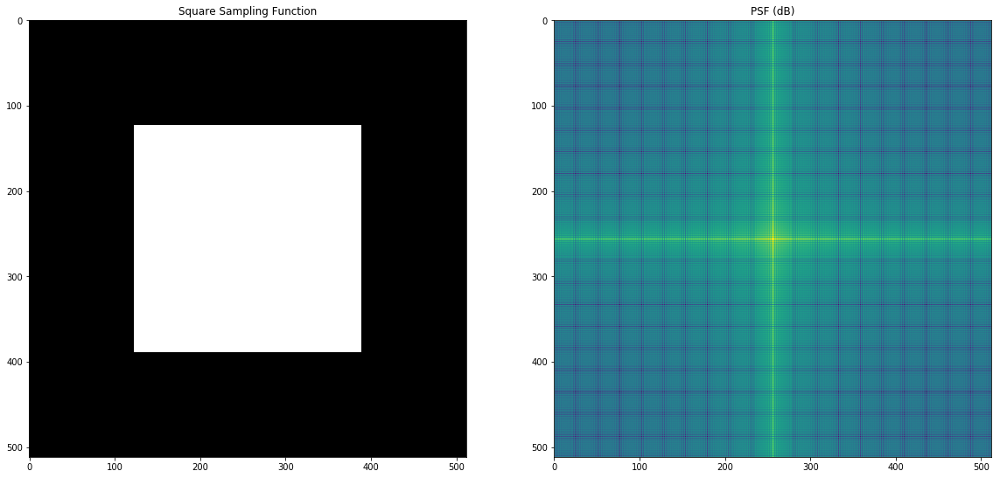

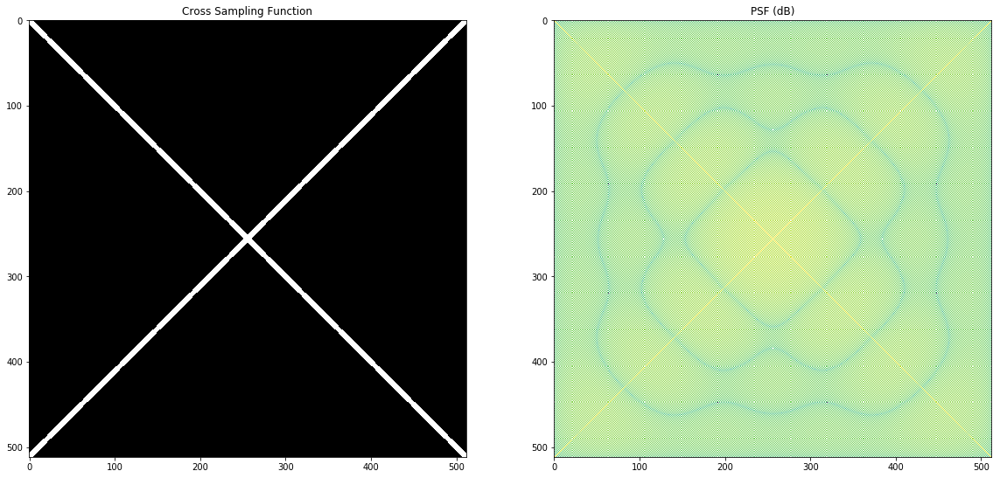

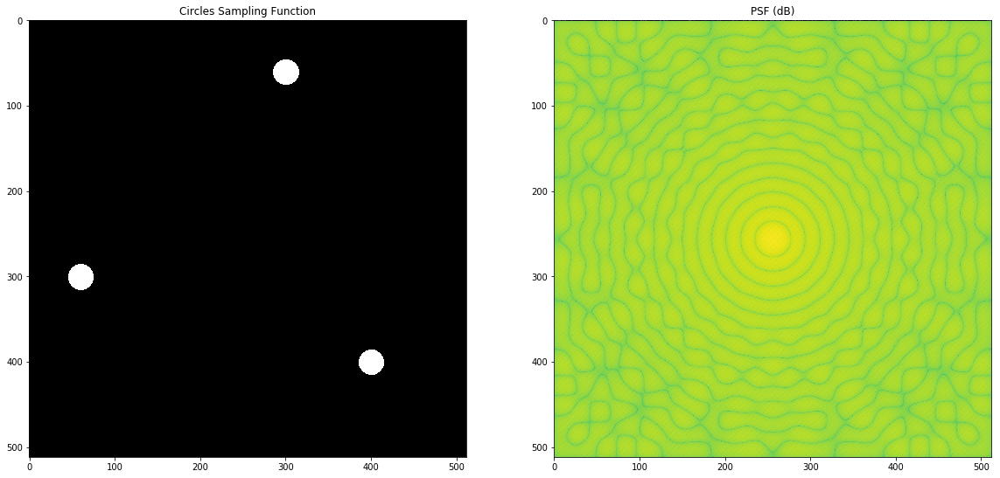

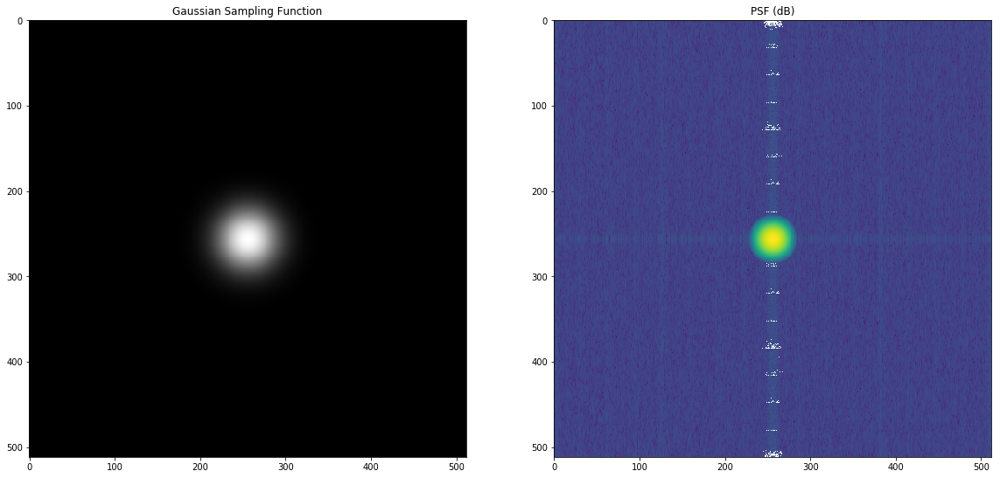

In [101]:
imgSize = 512

#Square
fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()
sampling = np.zeros((imgSize,imgSize), dtype='float')
sampling[int(imgSize/4.)-5:int(3.*imgSize/4.)+5, int(imgSize/4.)-5:int(3.*imgSize/4.)+5] = 1.


plt.subplot(1,2,1)
samplingPlot = plt.imshow(sampling)
plt.title('Square Sampling Function')
samplingPlot.set_cmap('gray')

plt.subplot(1,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('PSF (dB)')

#Cross
sampling = np.zeros((imgSize,imgSize), dtype='float')
xpos, ypos = np.mgrid[0:imgSize, 0:imgSize]
idx = np.argwhere(np.abs(xpos-ypos) < 5)
sampling[idx[:,0], idx[:,1]] = 1.
sampling[idx[:,0], (imgSize-1) - idx[:,1]] = 1.
fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
samplingPlot = plt.imshow(sampling)
plt.title('Cross Sampling Function')
samplingPlot.set_cmap('gray')

plt.subplot(1,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('PSF (dB)')

#Small Circles
sampling = np.zeros((imgSize,imgSize), dtype='float')
radius = 15
smallCirc = circularSamplingMap(2*radius+1, radius, 0)
sampling[60-radius:60+radius+1, 300-radius:300+radius+1] = smallCirc
sampling[300-radius:300+radius+1, 60-radius:60+radius+1] = smallCirc
sampling[400-radius:400+radius+1, 400-radius:400+radius+1] = smallCirc
fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
samplingPlot = plt.imshow(sampling)
plt.title('Circles Sampling Function')
samplingPlot.set_cmap('gray')

plt.subplot(1,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('PSF (dB)')

#Gaussian
xpos, ypos = np.mgrid[0:imgSize,0:imgSize]
sigma = 25.
sampling = np.exp(-1. * (((xpos - (imgSize/2.))**2. + (ypos - (imgSize/2.))**2.) / (2. * sigma**2.)))
fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
samplingPlot = plt.imshow(sampling)
plt.title('Gaussian Sampling Function')
samplingPlot.set_cmap('gray')

plt.subplot(1,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('PSF (dB)')

*第一行：矩形采样函数（左）和PSF（右）。
第二行：十字采样函数（左）和PSF（右）。
第三行：多圆采样函数（左）和PSF（右）。
第四行：高斯采样函数（左）和PSF（右）。
Row 1: Square sampling function (left) and the resulting PSF (right).
Row 2: Cross sampling function (left) and the resulting PSF (right).
Row 3: Set of circles sampling function (left) and the resulting PSF (right)
Row 4: Gaussian sampling function (left) and the resulting PSF (right)*

采样函数的不同形状对PSF以及后续的观测图像产生巨大影响。从上图可以看出，矩形采样函数的主瓣较强并伴随有周期性旁瓣结构。十字采样只在两个方向（对应了不同的空间频率）上进行采样，所产生的PSF呈现出一个较强的十字纹模式且伴随较高的旁瓣。不同位置的多个圆面所产生的PSF跟早先的单个圆面对应的PSF类似。高斯采样函数（本章后面还会讲到）的效果良好，其傅立叶变换是另一个高斯函数。后面会看到，我们通常会对采样函数进行调整，使其更像高斯。

Different shapes have a dramatic effect on the resulting PSF and hence the observed image. A square sampling function results in a strong primary lobe but underlying, repeated sidelobe structures. The cross sampling limits the samples to two orientations but at different spatial frequency scales, which results a strong cross pattern and high sidelobes. A collection of small circles at different positions results in a similar Airy disc of a single circle seen earlier. A Gaussian sampling function, which we will return to later in the chapter, has the nice feature that it's Fourier transform is another Gaussian. It is often desirable to taper, or modify, the sampling function to be more Gaussian-like. But, that is to come later.

回到前面的哈勃望远镜图像，我们将根据镜子的遮挡结构，生成相应的采样函数。

Returning to the Hubble image which we started the section with we can create a sampling function which approximates the obscuration pattern of the mirror.

Text(0.5,1,'Hubble PSF (dB)')

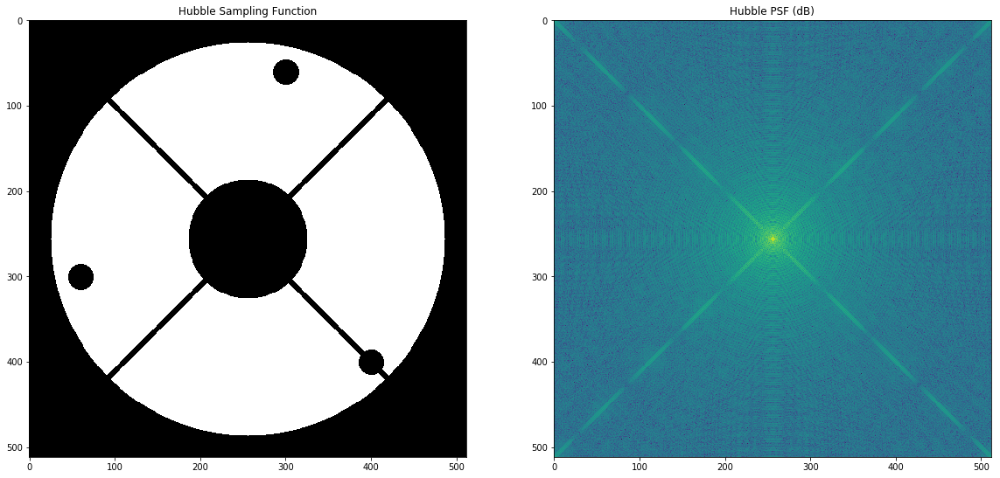

In [34]:
#Approximate Hubble PSF
#http://www.stsci.edu/institute/org/telescopes/Reports/krist_tinytim_spie.pdf

#ring sampling
sampling = circularSamplingMap(512, 230, 70)

#mask circle sections
radius = 15
smallCirc = circularSamplingMap(2*radius+1, radius, 0)
sampling[60-radius:60+radius+1, 300-radius:300+radius+1] -= smallCirc
sampling[300-radius:300+radius+1, 60-radius:60+radius+1] -= smallCirc
sampling[400-radius:400+radius+1, 400-radius:400+radius+1] -= smallCirc

#mask diagonals
xpos, ypos = np.mgrid[0:512, 0:512]
idx = np.argwhere(np.abs(xpos-ypos) < 5)
sampling[idx[:,0], idx[:,1]] = 0.
sampling[idx[:,0], 511 - idx[:,1]] = 0.

fig, axes = plt.subplots(figsize=(16,8))
fig.tight_layout()

plt.subplot(1,2,1)
samplingPlot = plt.imshow(sampling)
plt.title('Hubble Sampling Function')
samplingPlot.set_cmap('gray')

plt.subplot(1,2,2)
psfPlot = plt.imshow(10. * np.log10(np.abs( np.fft.fftshift( np.fft.fft2(sampling)))))
plt.title('Hubble PSF (dB)')

*图：哈勃望远镜的近似采样模型（左）；采样模型所对应的PSF函数（右），在很多哈勃图像上都能明显看到。Left: the approximate sampling pattern of the Hubble Telescope. Right: The resulting PSF from this sampling pattern which is apparent in many Hubble images.*

根据这近似的哈勃望远镜的采样模式，我们能看出前面哈勃望远镜拍摄的照片中的PSF形状的来源：十字结构来自于采样函数中的十字结构；因为采样环较大，所以主瓣比较紧凑；三个小圆造成了外围的低级别的艾里斑。

Based on this approximate sampling pattern for the Hubble telescope we can now see where the PSF shape we see in the image we started the section with has come from. The cross structure comes from the cross in the sampling function, the compact primary lobe is due to the large ring sampling, and the extended, low-level Airy disc is from the small circle patterns.

上述例子表明，采样函数的选择极大地影响了成图的效果。理想的采样函数必须要完整覆盖整个可见度域，但是，这绝不可能实现。首先，可见度域是无限延展的，要想获得高分辨率图像，需要建造大型望远镜才有可能尽量覆盖，然而，望远镜的规模受到了实际的工程制约，同时，仪器的最大分辨率也跟具体的科学研究目标有关。其次，上述例子中，我们都假定了所有的采样点都正好落在网格点上，构成图像的像素规则排列且尺寸相同（即一个采样点覆盖了一个像素区域），但实际情况是，望远镜的采样函数并不是由像素网格构成，而是连续的，必须通过一些近似的插值方法把这些采样点放置到规则矩阵中的适当位置，这个过程被称为“网格化gridding”，反之则被称为“去网格化degridding”。网格化的细节将在下一节讨论([$\S$ 5.3 &#10142;](5_3_gridding_and_degridding.ipynb))。后面将会看到，在干涉测量过程中，一组基线跟踪将产生复杂的采样函数，这跟干涉阵天线的布局、观测频率、天空指向、以及积分时间等因素有关。

From these various examples it should be clear that the choice of sampling greatly affects the resulting image. Ideally the sampling function completely covers the visibility domain, but that is never possible. First, the domain is infinite in extent, that is, by building a large telescope the resolution of the resulting image increases, this can go on *ad infinitum*. There is some practical engineering limit or scientific case to set the maximum resolution of an instrument. The second issue, which we have been hiding away in our examples is that we have assumed the sampling function is on a grid already. The array of pixels which make up the images are regularly spaced and all of the same size (i.e. the sample point covers the area of a pixel). In reality of course, telescope sampling functions are not made up of a grid of pixels, they are continuous. The sampling function must be transformed to a be placed on a regular array by some approximate interpolation method called *gridding* (along with an inverse method *degridding*). This will be covered in more detail in the next section ([$\S$ 5.3 &#10142;](5_3_gridding_and_degridding.ipynb)). As we will see in interferometry, an assembly of baseline tracks will lead to complex sampling functions dependent on a number of factors such as array layout, oberserving frequency, sky direction, and integration time.

### 5.2.4 KAT-7可见度采样和图像PSFs KAT-7 Visibility Sampling and Image PSFs

接下来，我们将利用KAT-7的模拟观测来探讨有关成像和去卷积方面的内容。KAT-7由7面天线构成，是MeerKAT的先导，MeerKAT位于南非北开普省的SKA-SA台址。

For the remainder of this chapter and the next we will use simulated observations of the KAT-7 array for exploring various aspects of imaging and deconvolution. The KAT-7 array is a seven element array which exists as a pre-cursor to the (currently in construction) MeerKAT array, located at the SKA-SA site in the Northern Cape of South Africa.

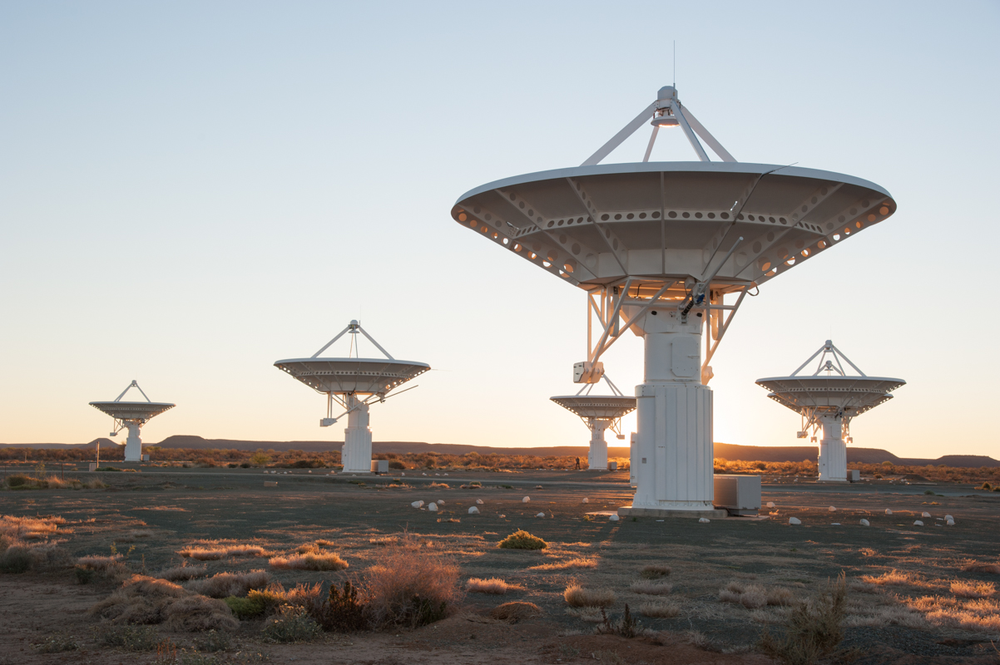

In [35]:
Image(filename='figures/2013_kat7_20.jpg')

*图：KAT-7望远镜阵列的居中5面天线，位于南非北开普省。Figure: Inner 5 dishes of the KAT-7 telescope array (pointed at zenith) located in the Northern Cape of South Africa. Credit: [SKA-SA &#10548;](http://www.ska.ac.za/media/2013_kat7.php)*

KAT-7的7面天线可以组成21种可能的干涉基线，把天线指向南天区，100MHz带宽，进行一次6小时观测，得到的可见度空间采样，即uv覆盖，如下图：

The seven elements of KAT-7 can be paired into 21 possible interferometric baselines. A typical observation with the array might be performed over 6 hours, covering 100 MHz of bandwidth, pointing at a southern declination. This would result in a visibility space sampling, i.e. 'uv coverage', similar to the figure below.

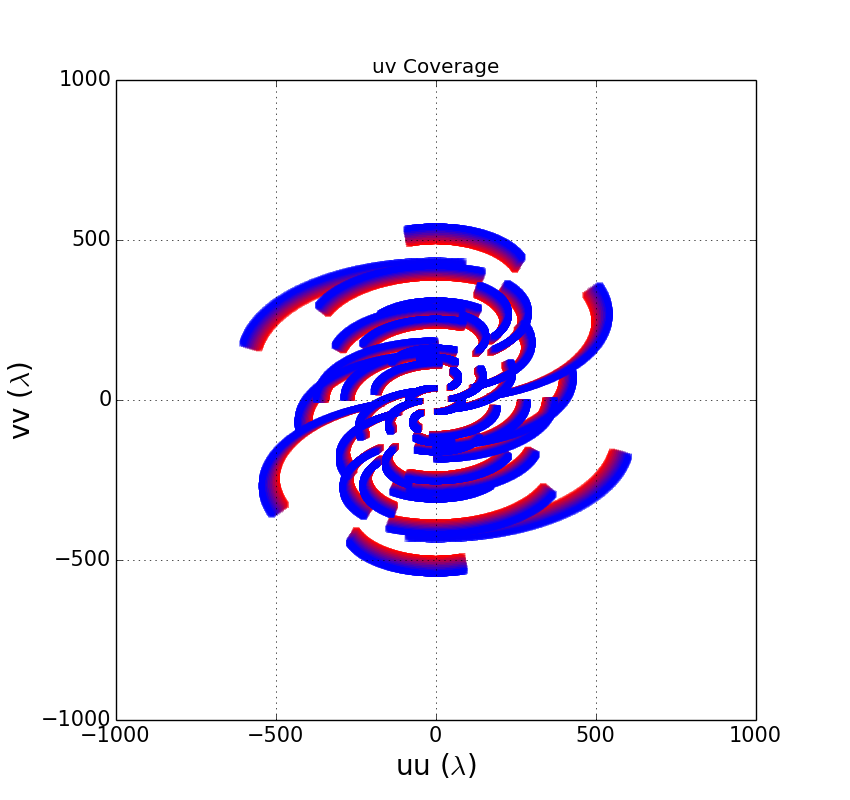

In [36]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec-30_10MHz_10chans.ms -s KAT-7_6h60s_dec-30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec-30_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。Figure: uv coverage from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees.*

采样图中的弧段被称为“可见度轨迹”，一条基线对应一条弧段。图中的轨迹有一定的宽度，并且着了颜色，标示出观测的带宽，红色一侧对应低频，蓝色一侧对应高频。可见度空间中，有些区域存在多次采样而发生轨迹重叠，本章后面我们会讨论到针对重复采样的处理方法[weighting schemes &#10142;](5_4_imaging_weights.ipynb)。也有一些没有采样的区域，被称为“uv覆盖空白”。值得注意的是中央区域的空白，如果观测中有自相关，那么其采样可以放在这个中央空白位置。类似于为哈勃采样函数生成PSF响应函数，我们也可以为KAT-7的uv覆盖生成一个PSF响应。

The various arcs in the sampling figure are colloquially called *visibility tracks* and are from a single baseline. Each track has a width, which has been coloured, to represent the bandwidth of the observation. The lowest frequency of the observation is represented by the red side of the track, and the highest frequency is the blue side. As can be seen, some tracks overlap in regions of the visibility space. These regions are being sampled multiple times during and observation, the issue of how to deal with this multi-sampling will come up latter in the chapter when we discuss [weighting schemes &#10142;](5_4_imaging_weights.ipynb). There are also empty regions of the sampling space, and one might talk about the 'holes in the uv coverage'. Notably is the central hole in the coverage, if the auto-correlations were included in an observation, this is the location in visibility space where these samples would be placed. As we created a PSF response from the Hubble sampling function, we can also create a PSF response for this KAT-7 uv coverage. 

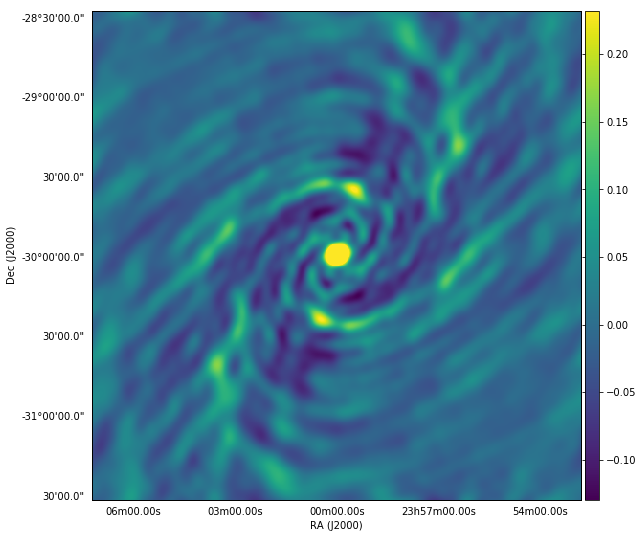

In [37]:
#wsclean -name KAT-7_6h60s_dec-30_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec-30_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_6h60s_dec-30_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 -30度中央峰值像素值为1，为显示旁瓣结构调整了色标。Figure: Point Spread Function from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees. The peak central pixel has a value of 1, but the color scale has been adjusted to show the sidelobe structure.*

PSF中央峰值波瓣的特征尺寸跟uv平面的采样分布有关。由PSF的生成可知，中央峰值代表了图像极大值，其值为1。次级的局部最大和最小，被称为PSF旁瓣，一些强的旁瓣值，其强度超过了主瓣的20%，在区分真实天空源和系统伪影的时候，这些旁瓣可能带来重大问题。减小旁瓣的方法有多种：长时间观测，增加观测带宽，选择不同的加权策略，或者在其它特殊情况下采用更多的基线。

The central peaked lobe of the PSF has a characteristic size which relates to the extent of the uv plane sampling distribution. By definition of how the PSF is produced, the central peak is the maximum of the image and has a value of 1. There are secondary, local maximums and minimums which are known as PSF sidelobes. Some of the brighest sidelobes are over 20% of the primary PSF lobe which can lead to significant issues when differentiating between real sky sources and the artefacts due to the system. There are various ways to reduce these sidelobes: observe for longer time periods, increase the observation bandwidth, choose a different weighting scheme, or use more baselines among other case-specific methods.

通过控制观测时长，从短时快照观测开始，逐步延长观测时间，我们可以看到uv覆盖逐步增加的过程。

By controlling the observation length, starting with a short 'snapshot' observation to progressively longer observations we can see how the uv coverage increases. 

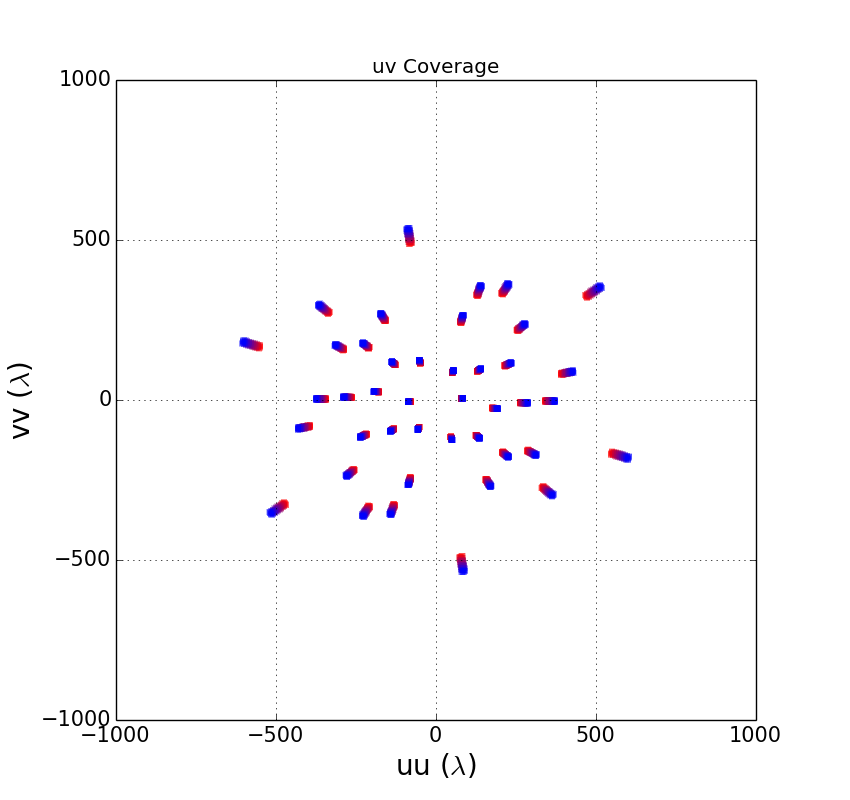

In [38]:
#plotUVcoverage.py -l 1000 -f KAT-7_0.167h60s_dec-30_10MHz_10chans.ms -s KAT-7_0.167h60s_dec-30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_0.167h60s_dec-30_10MHz_10chans.png')

*图：KAT-7的快照uv覆盖，观测时长10分钟，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。Figure: snapshot uv coverage from KAT-7 during a 10 minute, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees.*

短时快照观测的可见度平面采样稀疏，由于KAT-7天线布局随机，所以短时观测的基线采样没有重叠，所有21条基线的采样结果都有用。你也许已经注意到，图中有42条短轨迹，这是源于基线的共轭对，即天线A和天线B，可以是基线（A，B），也可以是基线（B，A）。采样的稀疏性导致较差的PSF响应，因为很多旁瓣的亮度已经跟主瓣相当。

With a short 'snapshot' observation the visibility plane is sparsely sampled, and due to the random distribution of KAT-7 there is no overlap in baseline sampling for such a short observation. All 21 unique baselines can be counted. You may notice there are 42 short tracks in this image, but that is from the conjugated baselines since a baseline pair, say antenna A and antenna B, can be seen as an (A,B) baseline or a (B,A) baseline. The sparsity of the visibility space sampling results in a poor PSF response as there are many sidelobes which are nearly as bright as the primary PSF lobe.

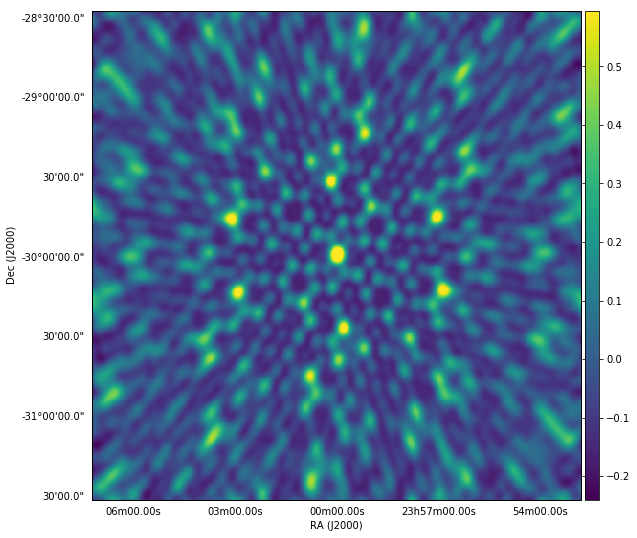

In [39]:
#wsclean -name KAT-7_0.167h60s_dec-30_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_0.167h60s_dec-30_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_0.167h60s_dec-30_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长10分钟，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。旁瓣强度跟主瓣相当。Figure: Point Spread Function from KAT-7 during a snapshot 10 minute, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees. Many of the sidelobes have nearly equivalent flux as compared to the central primary lobe.*

观测时长增加到2小时，可见度空间逐步填充，基线轨迹也开始出现重叠，PSF旁瓣开始相对于主瓣减弱。

Increasing the observation lenght to 2 hours begins to fill in the visibility space, with some of the baseline tracks beginning to overlap and the resulting PSF sidelobes begin to be reduced relative to the primary lobe.

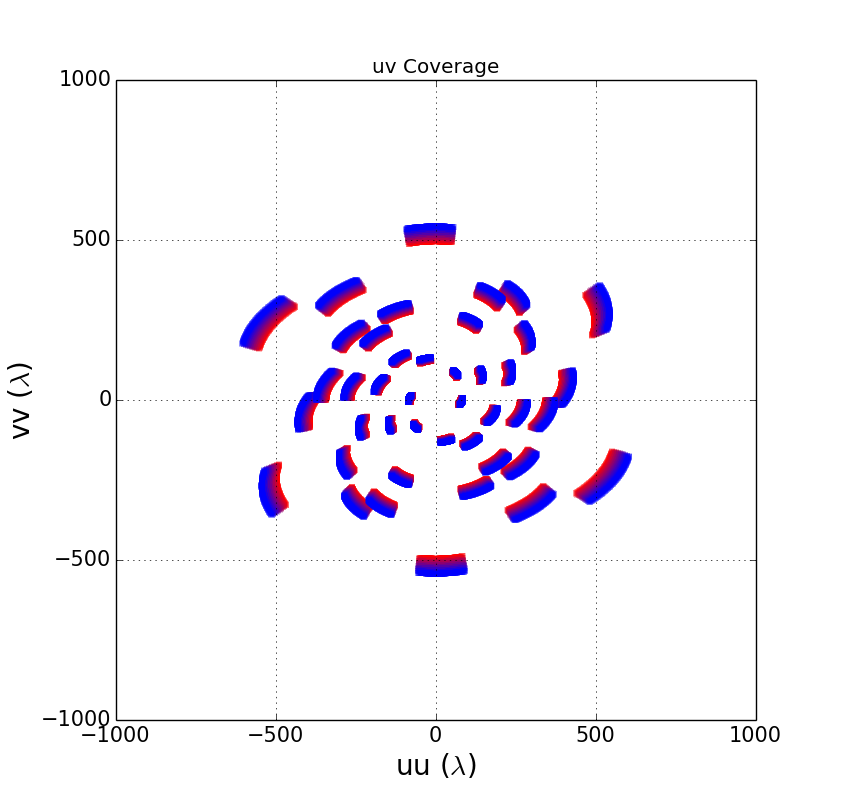

In [40]:
#plotUVcoverage.py -l 1000 -f KAT-7_2h60s_dec-30_10MHz_10chans.ms -s KAT-7_2h60s_dec-30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_2h60s_dec-30_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长2小时，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。Figure: uv coverage from KAT-7 during a 2 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees.*

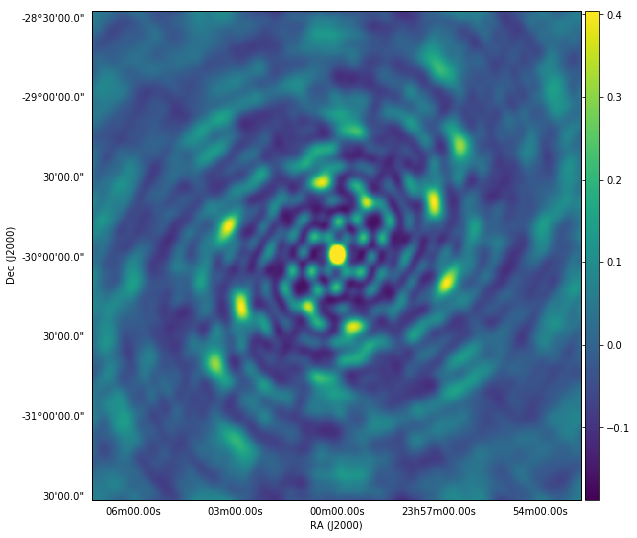

In [41]:
#wsclean -name KAT-7_2h60s_dec-30_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_2h60s_dec-30_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_2h60s_dec-30_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长2小时，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。Figure: Point Spread Function from KAT-7 during a 2 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees.*

在2小时PSF图上，我们可以看到，有很多旁瓣，特别是靠近边缘的旁瓣，已经消失不见，靠近中央的旁瓣也相对于快照PSF稍微有所减弱。随着观测时长增加到6消失，大多数旁瓣消失，增加到12小时，可见度空间几乎被填满，主瓣很强，旁瓣很小很弱。

We can see in the 2 hour PSF that many of the sidelobes, particularly those near the edge, have been 'washed' out and the sidelobes near the centre are slightly reduced in flux compared to the snapshot PSF. We can see that with increasing the observation to 6 hours that most of the sidelobes are washed out. Increasing the observation length further to 12 hours we can see the effect of near-completely filling in the visibility space is a strong central peak with small sidelobes.

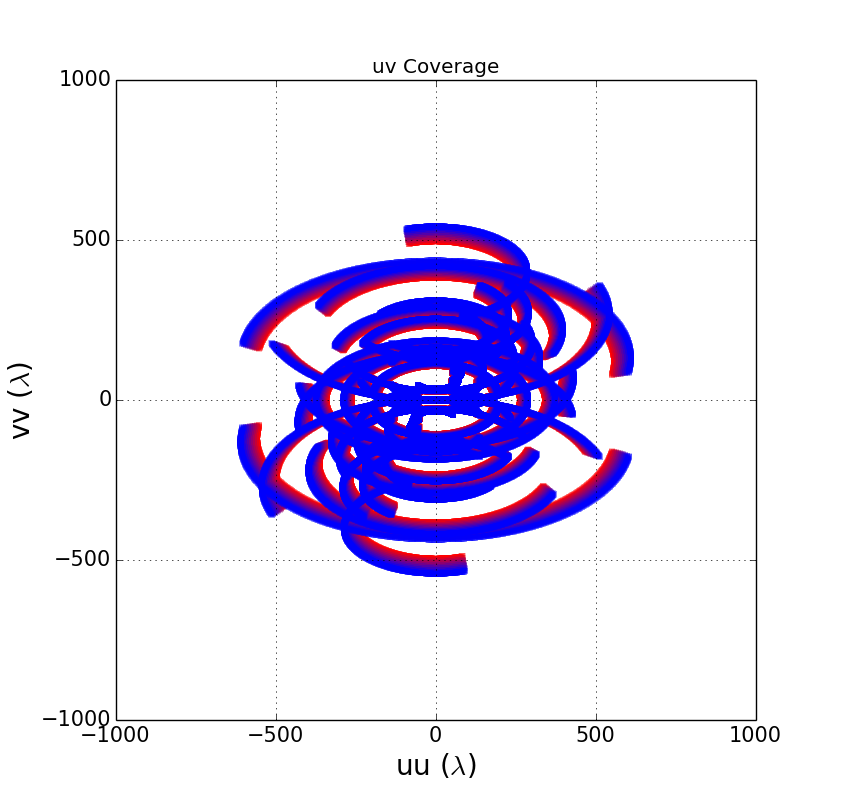

In [42]:
#plotUVcoverage.py -l 1000 -f KAT-7_12h60s_dec-30_10MHz_10chans.ms -s KAT-7_12h60s_dec-30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_12h60s_dec-30_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长12小时，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。Figure: uv coverage from KAT-7 during a 12 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees.*

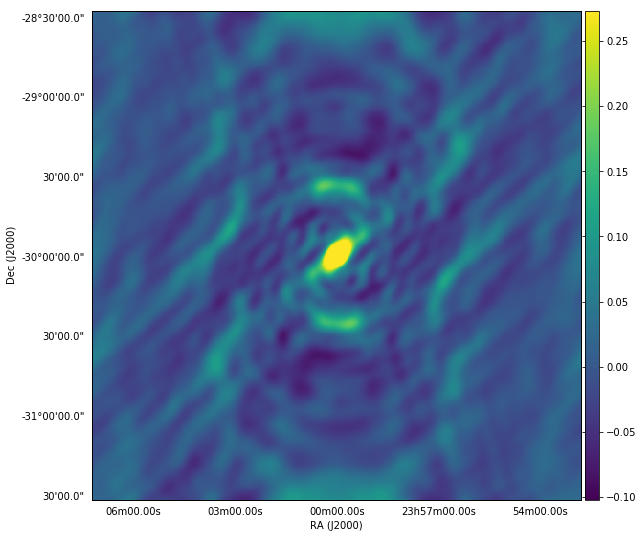

In [43]:
#wsclean -name KAT-7_12h60s_dec-30_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_12h60s_dec-30_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_12h60s_dec-30_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长12小时，带宽100MHz（1440MHz-1540MHz），赤纬 -30度。Figure: Point Spread Function from KAT-7 during a 12 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -30 degrees.*

在uv覆盖图上，我们可以看到观测带宽导致的轨迹宽度。如果把带宽减小到10MHz，观测时长仍然保持6小时，我们得到了一个比100MHz带宽更稀疏的可见度空间采样。

As we can see in the uv coverage plots, there is a width to the tracks due to the amount of frequency bandwidth sampled during an observation. If we decrease the bandwidth to 10 MHz for the 6 hour observation we end up with a sparser sampling of the visibility space compared to the 100 MHz bandwidth observation.

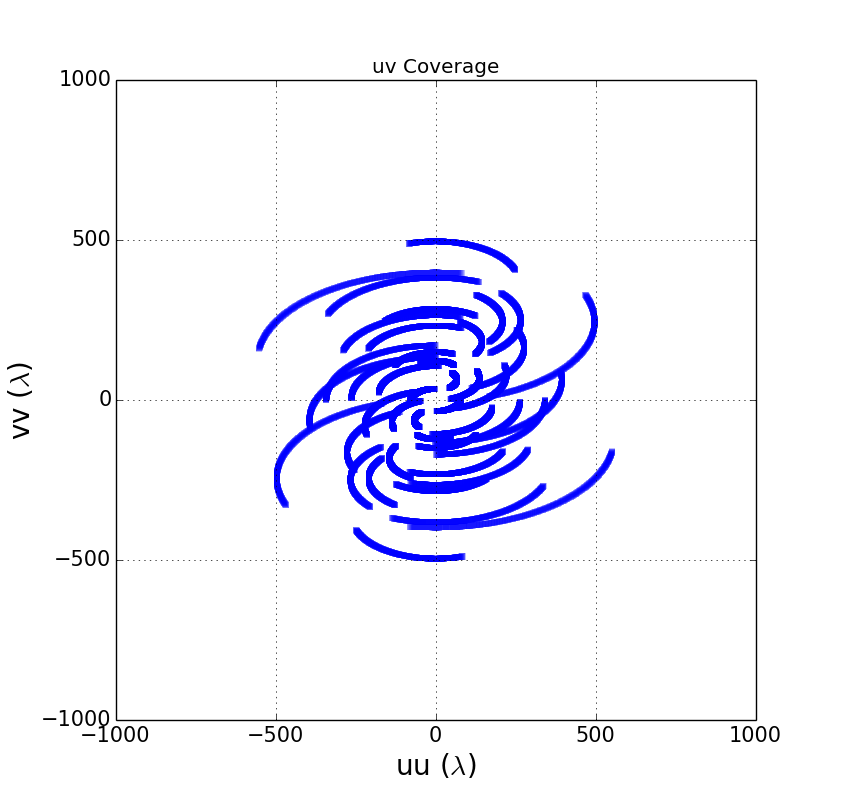

In [44]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec-30_10MHz_1chans.ms -s KAT-7_6h60s_dec-30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec-30_10MHz_1chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽10MHz（1440MHz-1450MHz），赤纬 -30度。Figure: uv coverage from KAT-7 during a 6 hour, 10 MHz observation (1440 MHz - 1450 MHz) of a field at declination -30 degrees.*

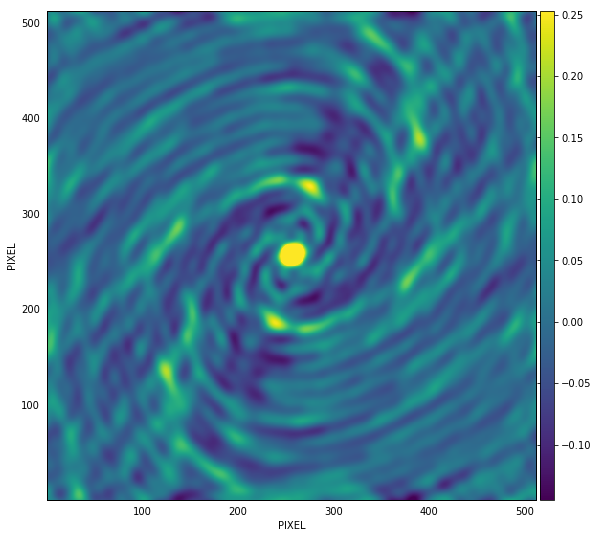

In [45]:
#wsclean -name KAT-7_6h60s_dec-30_10MHz_1chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec-30_10MHz_1chans.ms
# Note: there is a odd issue here with single channel measurement set images, wsclean, and aplpy
# using astropy FITS interface to workaround the issue
fh = fits.open('../data/fits/psfs/KAT-7_6h60s_dec-30_10MHz_1chans_natural-psf.fits')
img = fh[0].data
gc = aplpy.FITSFigure(img[0,0])
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽10MHz（1440MHz-1450MHz），赤纬 -30度。Figure: Point Spread Function from KAT-7 during a 6 hour, 10 MHz observation (1440 MHz - 1450 MHz) of a field at declination -30 degrees.*

带宽减小到10MHz，PSF的旁瓣布局几乎不变，但是尺寸比100MHz的旁瓣大。

The resulting PSF of the reduced bandwidth case has a similar sidelobe layout, but are larger compared to the original 100 MHz bandwidth case.

相反，带宽增加10倍到1GHz，可见度空间采样情况较好。

Conversely, if we increase the bandwidth during an observation by a factor of 10 to 1 GHz the visibility space will be well sampled.

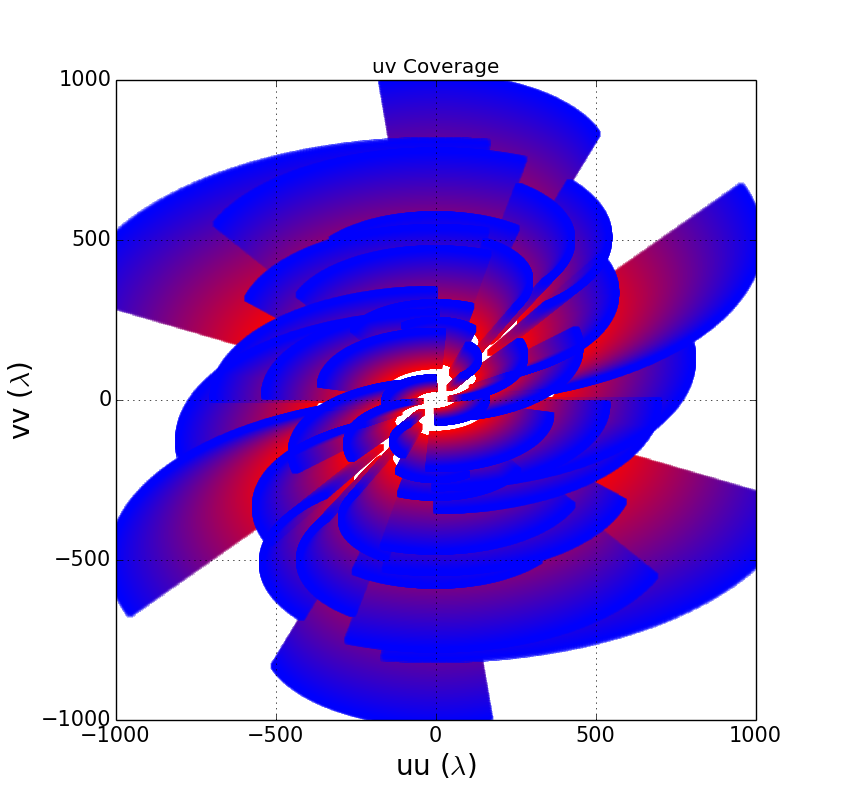

In [46]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec-30_10MHz_100chans.ms -s KAT-7_6h60s_dec-30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec-30_10MHz_100chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽1GHz（1440MHz-2440MHz），赤纬 -30度。Figure: uv coverage from KAT-7 during a 6 hour, 1 GHz observation (1440 MHz - 2440 MHz) of a field at declination -30 degrees.*

带宽增加导致可见度采样丰富，很多区域存在多次重复采样。然而，采样空白依然存在，特别是中央区域。天线的间距存在物理限制，对于KAT-7的天线来说，其直径为12米，因此没有哪条基线的长度能够比12米更短，这正是可见度空间中央区域留下空白的原因。

The increase in bandwidth results in much of the visibility space being well sampled, and many of the regions oversampled multiple times. But, there do remain holes in the sampling, especially near the centre. There is a physical limit to how close the antennas can be, a KAT-7 dish is 12 metres in diameter, so no baseline can be shorter than 12 metres.

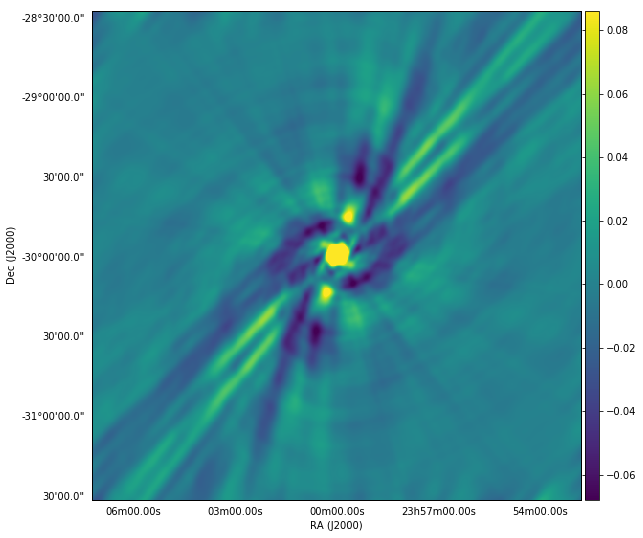

In [47]:
#wsclean -name KAT-7_6h60s_dec-30_10MHz_100chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec-30_10MHz_100chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_6h60s_dec-30_10MHz_100chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽1GHz（1440MHz-1540MHz），赤纬 -30度。Figure: Point Spread Function from KAT-7 during a 6 hour, 1 GHz observation (1440 MHz - 2440 MHz) of a field at declination -30 degrees.*

观测带宽增加到1GHz，uv覆盖中始终存在空白区域，因此PSF旁瓣结构始终存在，但是已经比之前都要弱。观测中增加采样带宽，可以带来采样空间更好的采样，也因此带来更好的原始成像。这是这些年来的一个重要思想，推动着新望远镜阵列朝着增加采样带宽的方向发展。然而，具体的科学目标也限制了带宽不能无限扩下去，这里不对这一话题做进一步讨论。

Some structure in the PSF sidelobes still exist due to the remaining holes in the coverage, but are lower compared to all other examples we have looked at so far. Increasing the amount of bandwidth sampled during an observation will result in a better sampled visibility space, and hence a better initial image. This is an important idea which over the years has led to a push towards increasing the sampling bandwidth of new telescope arrays. There is a limit to taking advantage of increased bandwidth depending on the science case, but that is an advanced topic not covered in this work.

跟其它望远镜不同的是，干涉测量阵列的PSF还跟赤纬有关，接下来我们将讨论这一重要参数。赤纬相关的简短解释为，阵列通常在地球表面呈3维分布，而基线都要投影到一个2维平面上，2维投影跟指向有关，因此指向不同，基线轨迹也不同。这是干涉测量阵列的一大优势，随着地球的自转，绘制出基线轨迹并填充可见度空间，然而，这同时也增加了观测的复杂性，因为每次观测的PSF都在变化。

Before this section concludes there is one more parameter which effects a radio interferometric array PSF which should be discussed. Unlike most other telescopes interferometric arrays have a declination-dependent PSF. The short reason for the declination dependence is that the array is distributed in 3-D space, usually on the surface of the Earth, and the baselines are projected onto a 2-D surface. Depending on the pointing direction the 2-D projection will result in different baseline tracks. This is one of the great advantages of interferometric arrays, as the Earth rotates the baseline tracks are drawn out to fill in regions of the visibility space. But, it adds a complication to observations as the PSF changes with every observation.

对北天极和南天极进行观测，产生的基线轨迹为圆形，相应的PSF的主瓣紧凑而旁瓣弱。另外，在整个恒星日内，极点之一（取决于阵列位于北半球还是南半球）都能被观测到。

Observing at the north and sourth celestial poles results in circular baseline tracks which results in a compact PSF primary lobe and low sidelobes. Additionally, one of the poles (depending on if the array is in the northern or southern hemisphere) is observable for the full extent of the sidereal day.

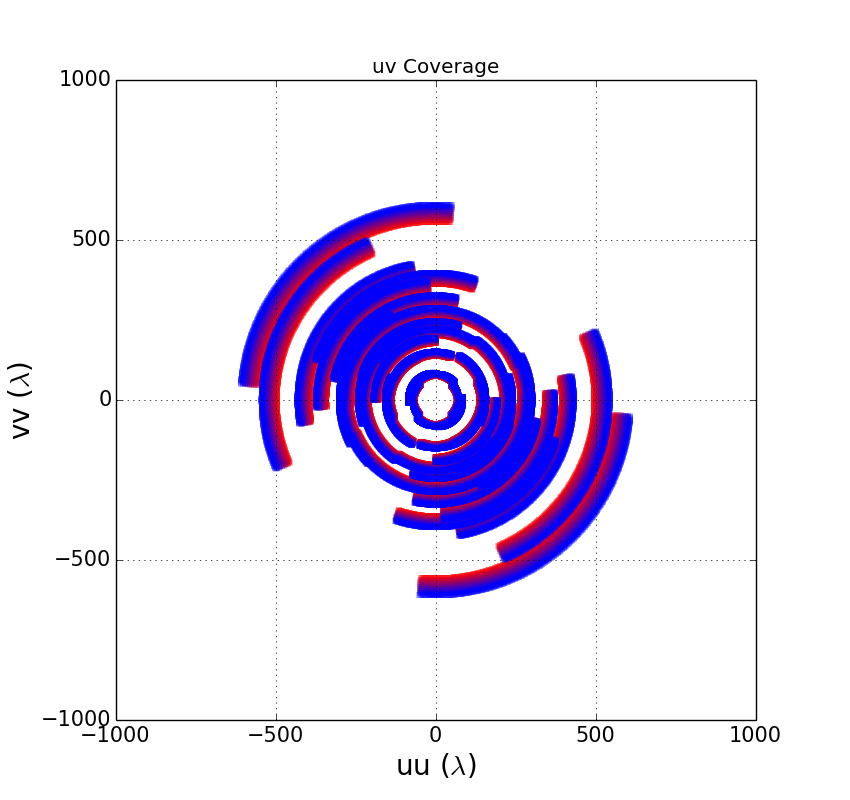

In [48]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec-90_10MHz_10chans.ms -s KAT-7_6h60s_dec-90_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec-90_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 -90度（南天极）。Figure: uv coverage from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -90 degrees (South Celestial Pole).*

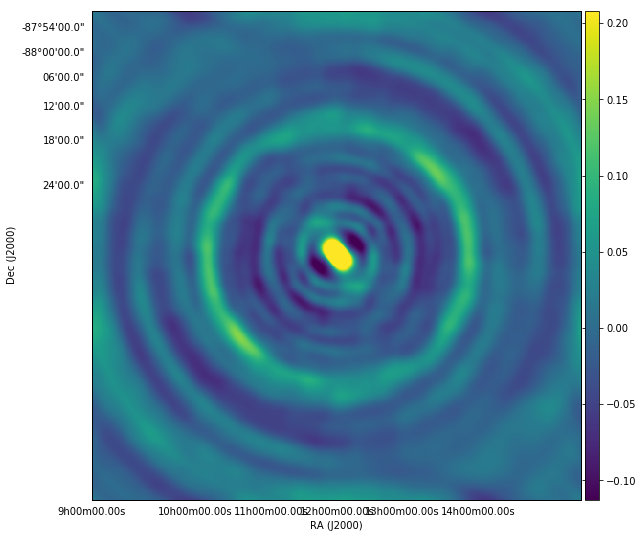

In [49]:
#wsclean -name KAT-7_6h60s_dec-90_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec-90_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_6h60s_dec-90_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 -90度（南天极）。Figure: Point Spread Function from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -90 degrees (South Celestial Pole).*

南天极的PSF看上去跟艾里斑采样的贝塞尔函数类似，随着观测时长和带宽的增加，其PSF趋向于贝塞尔响应。

The resulting PSF for the south celestial pole looks similar to the Bessel function from an Airy disc sampling function. As the observation length and bandwidth is increased the PSF will approach as Bessel function response.

指向北移，例如为-60度，基线轨迹变椭圆，可见度空间出现重复采样。

Observing at an intermediate declination, such as -60 degrees, results in tracks which are slightly elliptical and over-sampling occurs in some regions of the visibility space.

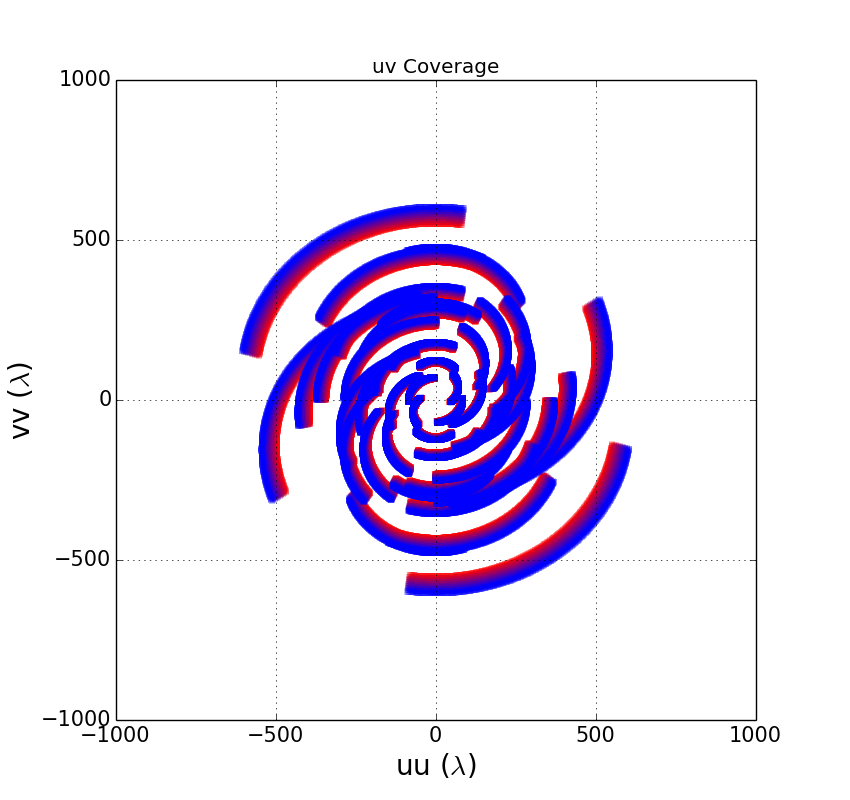

In [50]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec-60_10MHz_10chans.ms -s KAT-7_6h60s_dec-60_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec-60_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 -60度。Figure: uv coverage from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -60 degrees.*

采样的PSF有弧形旁瓣，并且比-90度的环行旁瓣亮，强度又不如-30的显著。

The PSF from this sampling has arced sidelobes which are brighter than the sidelobe rings at -90 declination, but not as strong as the prominent sidelobes at -30 degrees.

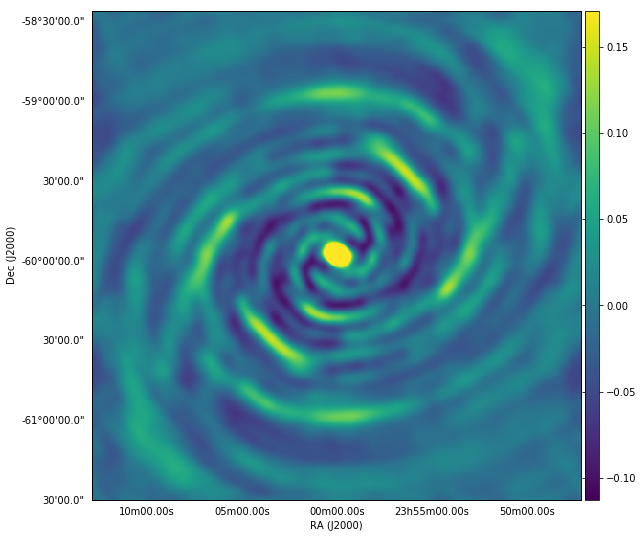

In [51]:
#wsclean -name KAT-7_6h60s_dec-60_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec-60_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_6h60s_dec-60_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 -60度。Figure: Point Spread Function from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination -60 degrees.*

可以看出，基线采样是赤纬的函数，随着指向偏离极点，轨迹由圆形变椭圆。当指向0度的时候，椭圆短轴为零，基线轨迹变成直线。
 
 We can see that the baseline sampling changes smoothly as a function of declination, with the tracks being circular at the north and sotuh poles with the tracks becoming elliptical as the observation moves away from the poles. This leads the particularly odd case of observations at 0 degrees declination. The tracks follow elliptical paths, at declination 0 degrees the minor semiaxis is of size 0, this results in tracks which are straight lines.

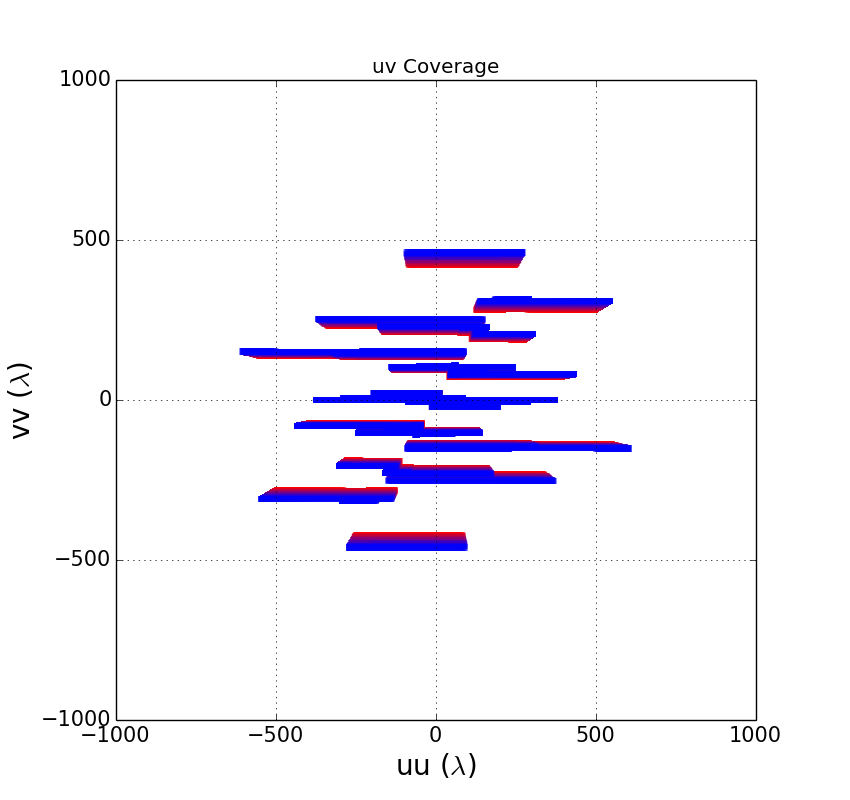

In [52]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec0_10MHz_10chans.ms -s KAT-7_6h60s_dec0_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec0_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 0 度。Figure: uv coverage from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination 0 degrees.*

这就导致了东西向的PSF好，而南北向旁瓣强，PSF不好。这正是通常要避免在0度附近进行观测的原因。

This effect results in a well formed PSF in the east-west direction, but a poor, high-sidelobe response in the north-south direction. Observations around declination 0 degrees are often avoided for this reason.

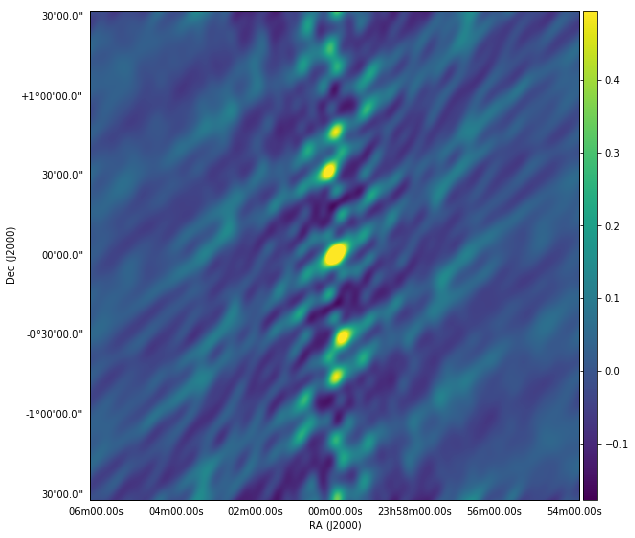

In [53]:
#wsclean -name KAT-7_6h60s_dec0_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec0_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_6h60s_dec0_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 0 度。Figure: Point Spread Function from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination 0 degrees.*

最后，我们来看一下位于南半球的阵列，对北天区进行观测时的PSF响应。

In a final example showing how the PSF response changes with declination we can look at an observation of a northern hemisphere field from a southern hemisphere array.

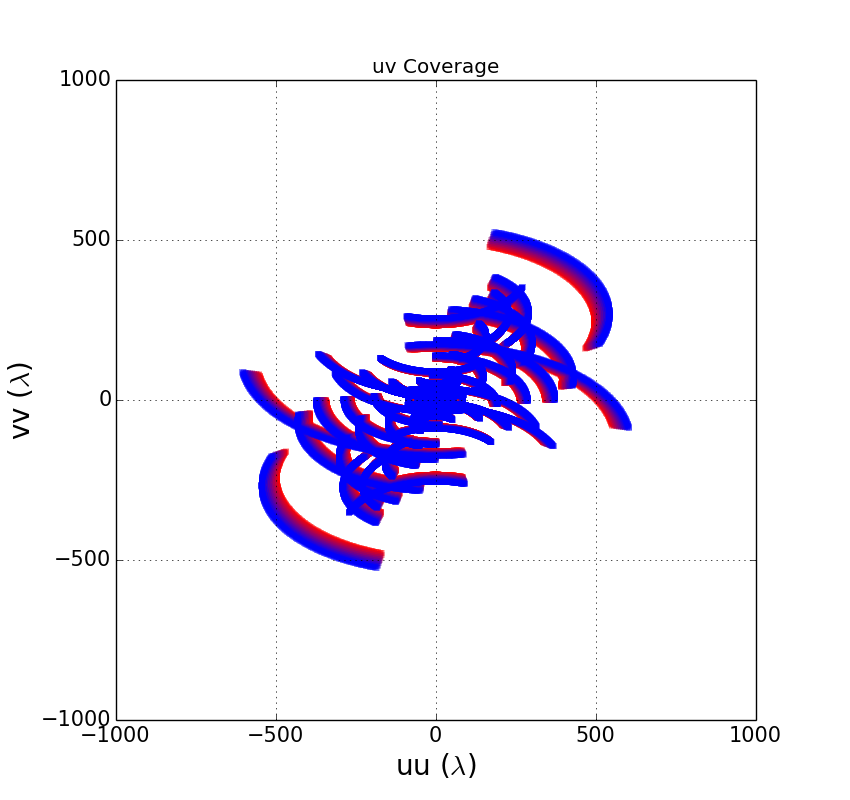

In [54]:
#plotUVcoverage.py -l 1000 -f KAT-7_6h60s_dec30_10MHz_10chans.ms -s KAT-7_6h60s_dec30_10MHz_10chans.png
Image(filename='figures/uvcoverage/KAT-7_6h60s_dec30_10MHz_10chans.png')

*图：KAT-7的uv覆盖，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 +30度。Figure: uv coverage from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination +30 degrees.*

+30度的uv覆盖跟-30度的uv覆盖类似，事实上，两者都是对同一个完整的uv椭圆的不同部分进行采样，因为实际上它们彼此共轭。但是，由于受到地平限制，北半球可能的总覆盖要少于南半球。

Comparing this coverage to that of the coverage for a field at declination -30 degrees one should notice that there is a similarity between the two. In fact, both sample different sections of the same complete uv ellipses, as they are effectively conjugates of each other, but the total possible coverage for the northern hemisphere field is limited compared to the sothern hemisphere due horizon limits.

现在，我们基于uv覆盖，凭直觉建立相应的PSF响应。比如，就+30度的例子来看，相比于左上和右下两个向限，uv采样朝着右上和左下两个向限延展，这就意味着相应的PSF主瓣将为椭圆形状，因为我们在一个方向上做了对角线模式的采样。在下面的PSF响应图上，我们可以看到主瓣确实呈椭圆形状。

Hopefully at this point we are starting to build up intuition on what the resulting PSF response will be based on the uv coverage. For example, in our declination +30 degrees case the coverage is sampled further out in the top-right and bottom-left quadrants compared to the top-left and bottom-right quandrants. This should indicate that the resulting PSF primary lobe will be elliptical, as we are better sampling the diagonal modes in one direction versus the other. IN the PSF response below we can see that the primary lobe is indeed elliptical.

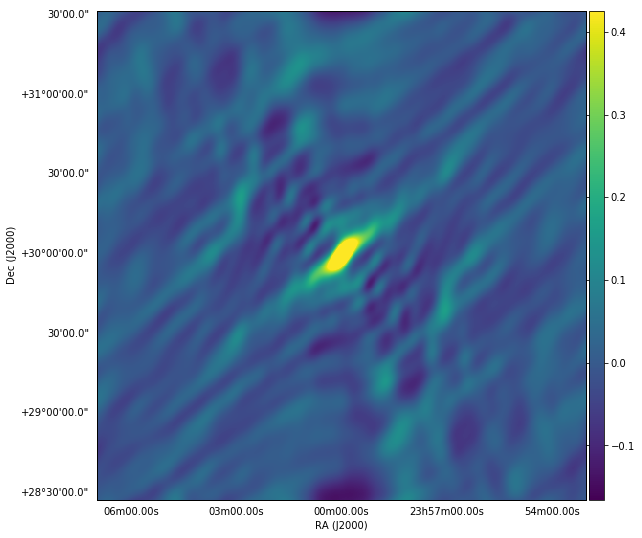

In [55]:
#wsclean -name KAT-7_6h60s_dec30_10MHz_10chans -size 512 512 -scale 0.004 -nosmallinversion -weight natural
# -makepsf KAT-7_6h60s_dec30_10MHz_10chans.ms
gc = aplpy.FITSFigure('../data/fits/psfs/KAT-7_6h60s_dec30_10MHz_10chans_natural-psf.fits')
gc.show_colorscale(cmap='viridis')
gc.add_colorbar()

*图：KAT-7的点扩散函数，观测时长6小时，带宽100MHz（1440MHz-1540MHz），赤纬 +30度。Figure: Point Spread Function from KAT-7 during a 6 hour, 100 MHz observation (1440 MHz - 1540 MHz) of a field at declination +30 degrees.*

随着成像技术特别是下一章将要讲到的去卷积技术的发展，观测依赖PSF的影响将变得越来越重要。

The effect of an observation-dependent PSF will play an important role again and again as we progress through the imaging and particularly when we come to deconvolution in the next chapter.

这里有必要提一下“理想”采样函数以及相应的PSF。显然，理想采样函数会对整个空间频率进行无限分辨率采样，然而，这自然是不现实的，仪器限制和无限大的数据量使得理想采样无法成为现实。一个更为现实的做法是根据分辨率需求，按照奈奎斯特频率对整个空间频率域进行采样，这实际上就是一个艾里斑采样函数。然而，艾里函数的尖锐边缘会导致强的PSF旁瓣。如果我们采用高斯函数，而高斯函数的傅立叶变换也是一个高斯函数，因此会得到良好的效果。艾里斑的大小就是高斯的半高全宽（FWHM）。在去卷积一章中讲到图像复原的时候，还会用到这个思路。

It is worth bringing up the idea of the 'ideal' sampling function and resulting PSF for a moment. Obviously the ideal sampling function would sample all spatial frequencies out to infinite resolution. But, of course this is not realistic, instrumentational limits do not make this possible, and the resulting amount of data would be infinite. This is a bit of a strawman argument, a more realistic ideal PSF would be to fully sample all spatial frequencies out to the Nyquist frequency based on the desired resolution. Effectively this would be an Airy disc sampling function. But, the sharp edge of the Airy function results in strong PSF sidelobes. If instead, a Gaussian is used, this has a nice feature in which the Fourier transform of a Gaussian is another Gaussian. The scale of this Gaussian is with a full width at half maximum (FWHM) on the scale of the Airy disc. This idea will arise again when the restored image is introduced in the deconvolution chapter.

### 5.2.5 东西阵和二维阵比较 A comparison between East-West and two-dimensional arrays

讨论完KAT-7采样函数的特点以后，有必要对一维阵列和类似KAT-7这样的二维阵列进行比较，指出两者之间的区别。为了进行比较，让我们看一下Westerbork Synthesis Radio Telescope (WSRT) 和 Jansky Very Large Array (JVLA)。

Now that you have seen some properties of the KAT-7 sampling function it is important to point out the differences between one dimensional and two dimensional layouts like that of the KAT-7 array. To draw this comparison we look at the Westerbork Synthesis Radio Telescope (WSRT) and the Jansky Very Large Array (JVLA).

WSRT沿东西方向有14面天线，其中4面可以移动。JVLA有27面天线，呈Y形排列。

The WSRT has 14 antennae along the East-West direction, 4 of which can be moved along rales. The JVLA has 27 reconfigurable antennae layed out in a Y-shape.

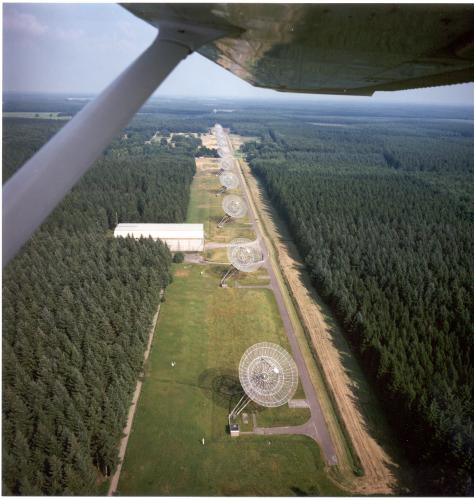

In [56]:
Image(filename='figures/luchtfoto-WSRT.jpg')

*图：WSRT的航拍照片，14面天线按东西方向布局。。Figure: Arial photo of WSRT. WSRT has 14 antennae layed out East to West. Image courtesy of ASTRON*

下面是Westerbork的92m布局图，以及不同指向的观测。可以看出，对于这样的东-西排列的阵列，在进行低赤纬观测时，其uv覆盖和瞬时覆盖都不好。

Below Westerbork in its 92m configuration is plotted, as well as observations at several declinations. As you can see such an East-West array does not have good coverage at low declinations, nor does it have good instantanious coverage.

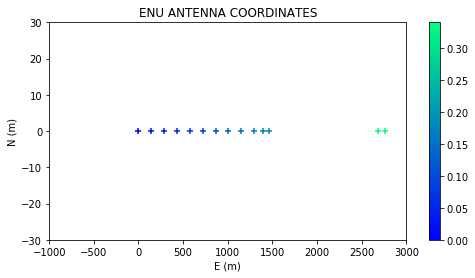

In [57]:
#Globals file with Westerbork 92m-configuration antenna ENU coordinates
%run westerbork_92m_constants.py
plt.figure(figsize=(8, 4))
plt.title("ENU ANTENNA COORDINATES")
plt.scatter(ENU[:,0],
         ENU[:,1],
         c=ENU[:,2],
         marker="+",
         cmap="winter")
plt.colorbar()
plt.xlabel("E (m)")
plt.ylabel("N (m)")
plt.xlim([-1000,3000])
plt.ylim([-30,30])
plt.show()

*图：Westerbork的92m结构，色条标示各天线跟参考天线之间的高差。Figure: The 92m configuration of Westerbork. The colourbar indicates difference in height from the reference antenna.*

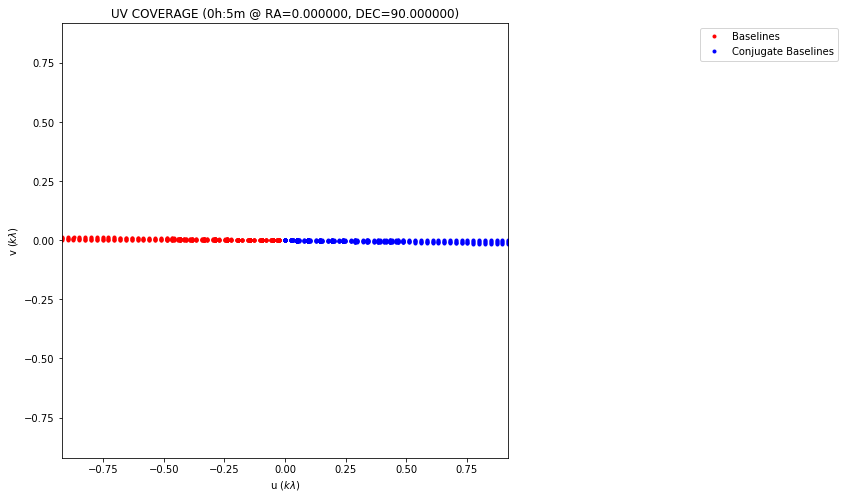

In [58]:
uv_5min = track_simulator.sim_uv(0.0, 90.0, 5/60.0, 60/3600.0, ENU, ARRAY_LATITUDE, True, True, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

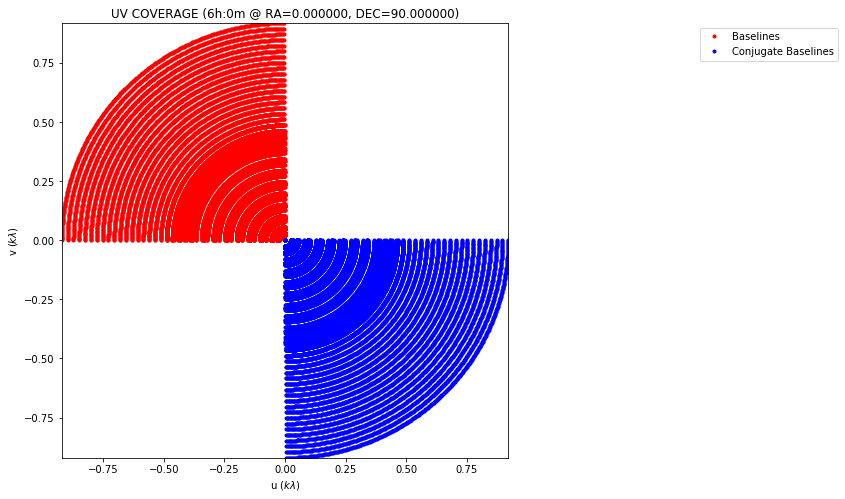

In [59]:
uv_6hrs_90_dec = track_simulator.sim_uv(0.0, 90.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, True, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

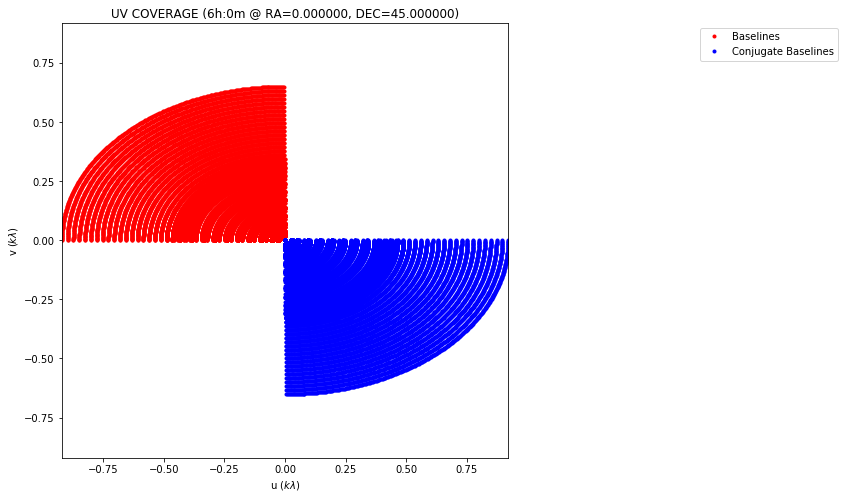

In [60]:
uv_6hrs_45_dec = track_simulator.sim_uv(0.0, 45.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, True, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

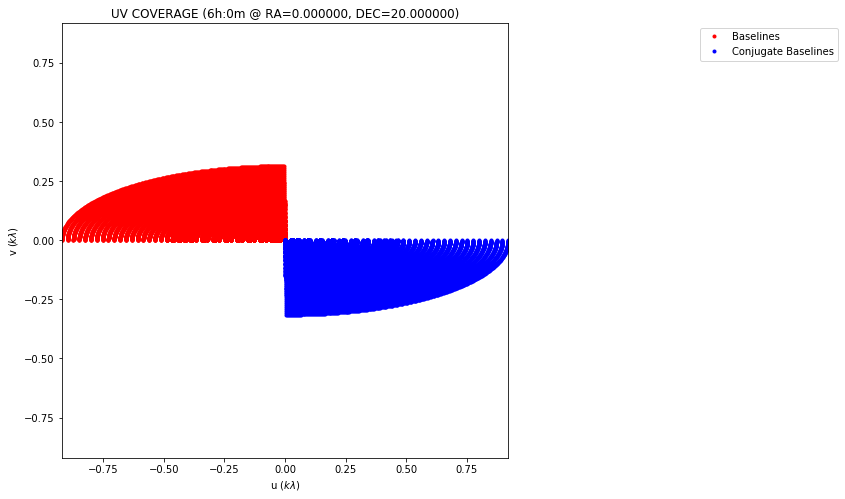

In [61]:
uv_6hrs_20_dec = track_simulator.sim_uv(0.0, 20.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, True, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

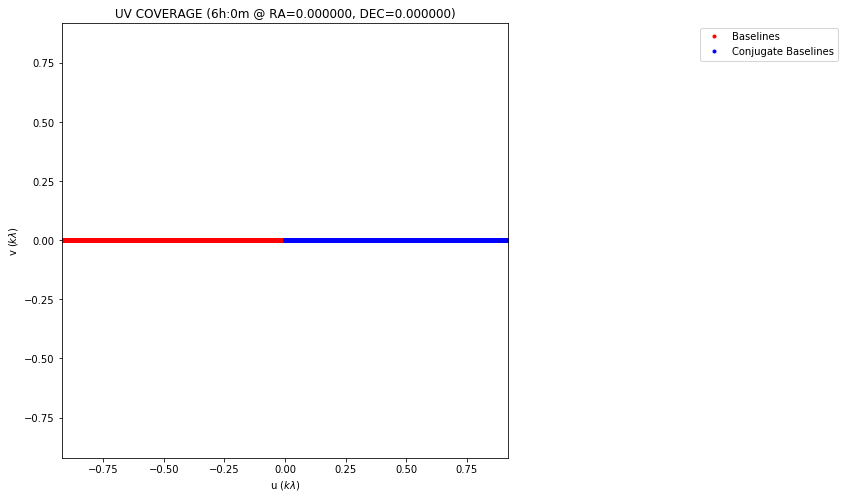

In [62]:
uv_6hrs_0_dec = track_simulator.sim_uv(0.0, 0.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, True, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

*图：Westerbork指向不同赤纬时的采样函数。Figure: Westerbork sampling function coverage at various declinations in D-configuration.*

$\delta=90^\circ$时投影基线为同心圆，随着$\delta$降低，投影变直。当$\delta$变的很小时，uv覆盖基本上变成一条直线。这里绘制了基线以及它们的共轭，干涉仪同时测量了可见度和复共轭（基线和其相反数），共轭基线为冗余测量，可以舍弃。

The projection of the baselines onto the UV plane at declination $\delta=90^\circ$ are concentric circles. As the observation declination decreases the projections become straight lines. As you can see the coverage at low declinations are essentially a straight line. Here the baselines and their conjugates are plotted. An interferometer measures both the visibility and its complex conjugate simultaniously (baseline and its negative). The conjugate baselines are redundant measurements and can be discarded.

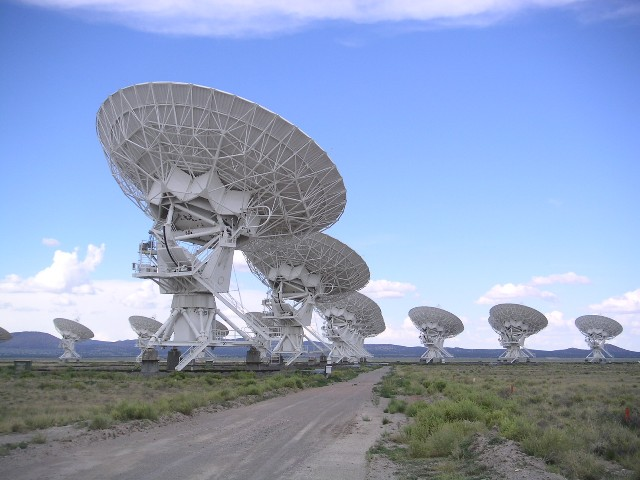

In [63]:
Image(filename='figures/vla_photo.jpg')

*图：位于新墨西哥Sorroco附近的JVLA 27面天线。照片来自Wikipedia。Figure: The 27 antenna JVLA near Sorroco, New Mexico. Image courtesy of Wikipedia*

下面是不同赤纬不同观测时长的JVLA的uv覆盖。可以看出，JVLA的瞬时uv覆盖要比WSRT好很多。

Below the JVLA in its compact D-configuration is plotted at various declinations and observation lengths. As is shown the VLA has reasonably good instantanious uv-coverage compared to the WSRT.

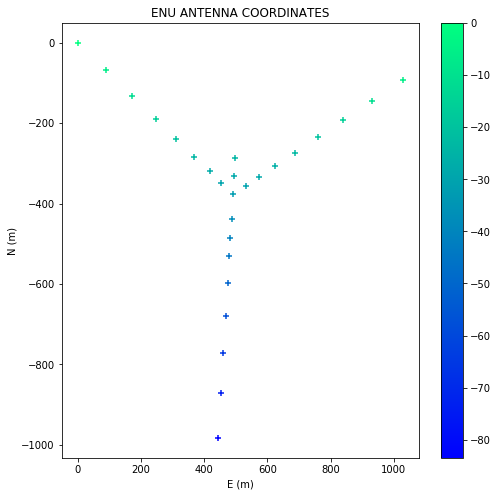

In [64]:
#Globals file with JVLA D-configuration antenna ENU coordinates
%run jvla_d_constants.py
plt.figure(figsize=(8, 8))
plt.title("ENU ANTENNA COORDINATES")
plt.scatter(ENU[:,0],
         ENU[:,1],
         c=ENU[:,2],
         marker="+",
         cmap="winter")
plt.colorbar()
plt.xlabel("E (m)")
plt.ylabel("N (m)")
plt.show()

*图：JVLA的紧凑D-configuration，色条标示各天线跟参考天线之间的高差。Figure: The compact D-configuration of the VLA. The colourbar indicates difference in height from the reference antenna.*

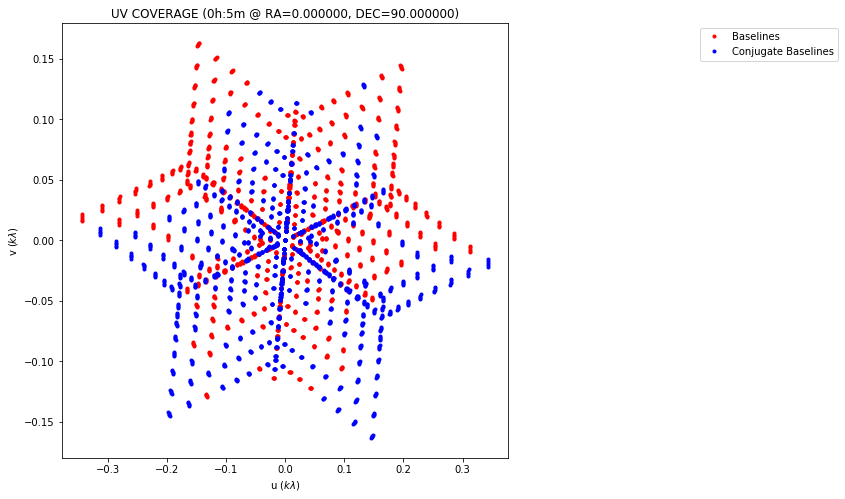

In [65]:
uv_5min = track_simulator.sim_uv(0.0, 90.0, 5/60.0, 60/3600.0, ENU, ARRAY_LATITUDE, True, False, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

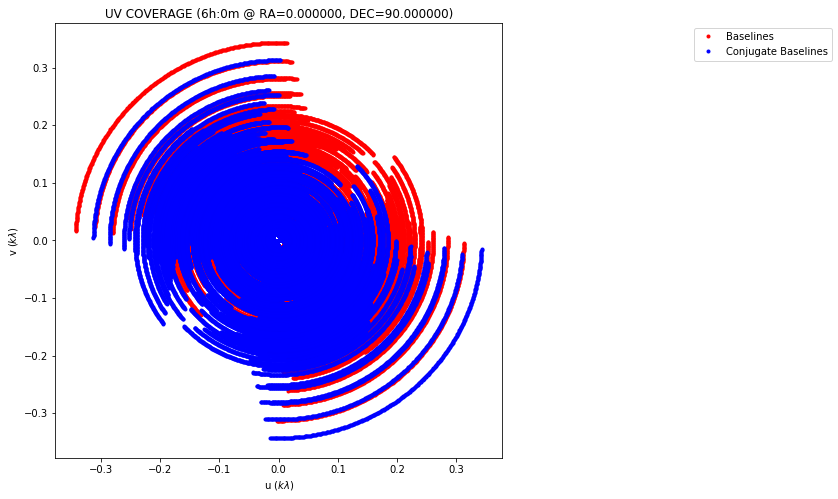

In [66]:
uv_6hrs_90_dec = track_simulator.sim_uv(0.0, 90.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, False, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

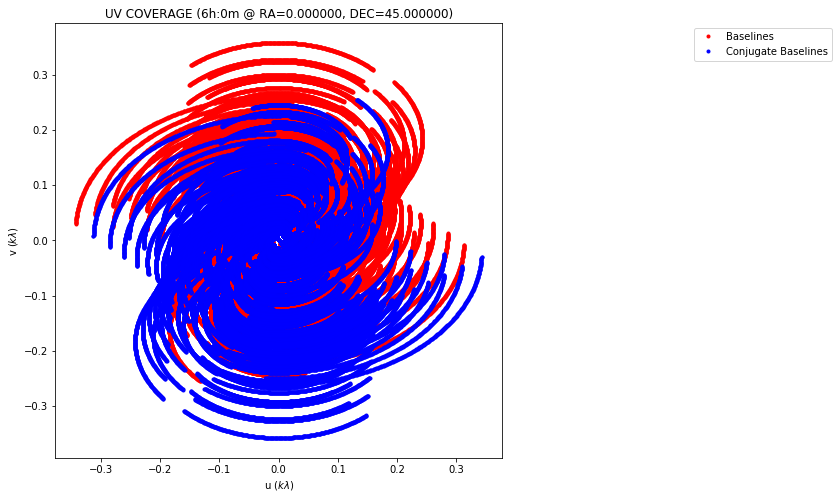

In [67]:
uv_6hrs_45_dec = track_simulator.sim_uv(0.0, 45.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, False, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

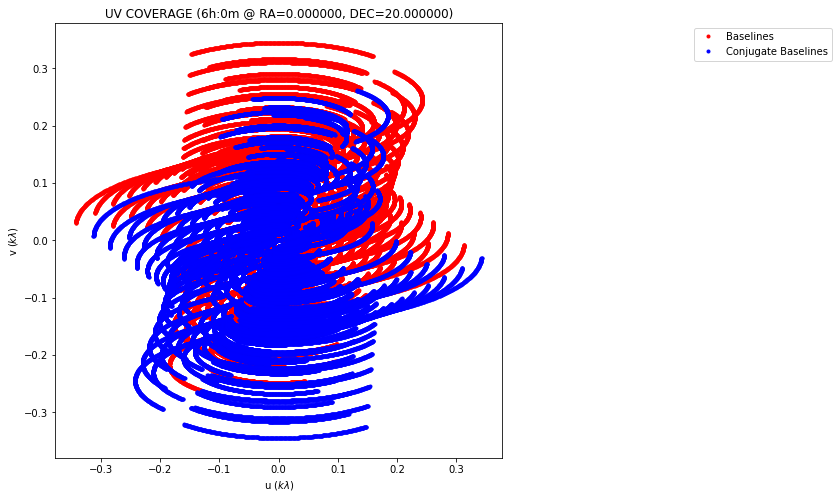

In [68]:
uv_6hrs_20_dec = track_simulator.sim_uv(0.0, 20.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, False, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

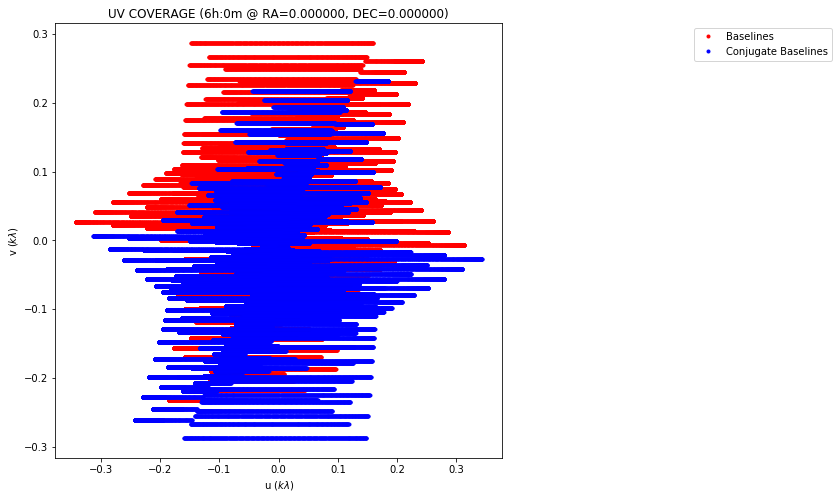

In [69]:
uv_6hrs_0_dec = track_simulator.sim_uv(0.0, 0.0, 6, 60/3600.0, ENU, ARRAY_LATITUDE, True, False, CENTRE_CHANNEL)/CENTRE_CHANNEL/1e4

*图：JVLA指向不同赤纬时的采样函数。Figure: VLA sampling function coverage at various declinations in D-configuration. *

$\delta=90^\circ$时投影基线为同心圆，随着$\delta$降低，投影变直。这里绘制了基线以及它们的共轭。

The projection of the baselines onto the UV plane at declination $\delta=90^\circ$ are concentric circles. As the observation declination decreases the projections become straight lines. Here the baselines and their conjugates are plotted.

无论是瞬时覆盖还是低赤纬覆盖，二维的JVLA都要远远优于东-西向的WSRT，原因在于，当阵列中没有非东-西向基线时，不是所有的基线都处于同一平面。**注意，就算是所有天线都精确位于同一个平面上，情况也如此。** 这点在三纬uvw空间上很容易看出来。

As illustrated both the instantanious and low declination coverage of the two-dimensional JVLA is far better than the east-west WSRT. The reason for this improved coverage is that not all baselines lie on the same plane when the array has non-east-west baselines. **Note that this is true even if such a two dimensional layout is on a perfectly flat plane.** This is easily visualized in three-dimensional uvw space.

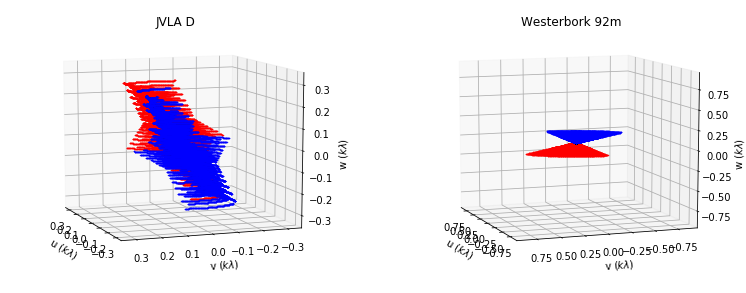

In [70]:
zslider=FloatSlider(description="Z-rotation",min=0,max=360,value=160, step=1, continuous_update=False)
xslider=FloatSlider(description="X-rotation",min=-90,max=90,value=10, step=1, continuous_update=False)
def interact_plot(key):
    clear_output(wait=True)
    DECLINATION = 90
    T_OBS = 3.5
    T_INT = 1/60.0
    %run jvla_d_constants.py
    uvw_2hr_jvla_d = track_simulator.sim_uv(0.0,DECLINATION,T_OBS,T_INT,ENU,ARRAY_LATITUDE,False)/CENTRE_CHANNEL/1e4
    %run westerbork_92m_constants.py
    uvw_2hr_westerbork = track_simulator.sim_uv(0.0,DECLINATION,T_OBS,T_INT,ENU,ARRAY_LATITUDE,False)/CENTRE_CHANNEL/1e4
    fig = plt.figure(figsize=(13, 5))
    ax=fig.add_subplot(121, projection='3d')
    ax.set_title("JVLA D")
    ax.plot(uvw_2hr_jvla_d[:,0],
            uvw_2hr_jvla_d[:,1],
            uvw_2hr_jvla_d[:,2],
            'r.',markersize=1)
    ax.plot(-uvw_2hr_jvla_d[:,0],
            -uvw_2hr_jvla_d[:,1],
            -uvw_2hr_jvla_d[:,2],
            'b.',markersize=1)
    ax.set_xlabel("u ($k\lambda$)")
    ax.set_ylabel("v ($k\lambda$)")
    ax.set_zlabel("w ($k\lambda$)")
    lims = max(np.abs(np.min(uvw_2hr_jvla_d)),
               np.abs(np.max(uvw_2hr_jvla_d)))
    ax.set_xlim([-lims, lims])
    ax.set_ylim([-lims, lims])
    ax.set_zlim([-lims, lims])
    
    ax.view_init(elev=xslider.value, azim=zslider.value)

    ax=fig.add_subplot(122, projection='3d')
    ax.set_title("Westerbork 92m")
    ax.plot(uvw_2hr_westerbork[:,0],
            uvw_2hr_westerbork[:,1],
            uvw_2hr_westerbork[:,2],
            'r.',markersize=1)
    ax.plot(-uvw_2hr_westerbork[:,0],
            -uvw_2hr_westerbork[:,1],
            -uvw_2hr_westerbork[:,2],
            'b.',markersize=1)
    ax.view_init(elev=xslider.value, azim=zslider.value)

    ax.set_xlabel("u ($k\lambda$)")
    ax.set_ylabel("v ($k\lambda$)")
    ax.set_zlabel("w ($k\lambda$)")
    lims = max(np.abs(np.min(uvw_2hr_westerbork)),
               np.abs(np.max(uvw_2hr_westerbork)))
    ax.set_xlim([-lims, lims])
    ax.set_ylim([-lims, lims])
    ax.set_zlim([-lims, lims])
    
    plt.show()
zslider.observe(interact_plot)
display(zslider)
xslider.observe(interact_plot)
display(xslider)
interact_plot("")

*Figure: UVW coverage of an 3h30min observation at $\delta=90^\circ$ on JVLA D and Westerbork 92m configuration*

The only downside to using arrays with non-East-West baselines is that it introduces artifacts when imaging wider fields of view. We will discuss this in detail in the chapter on the widefield effect.

### 5.2.6 The JVLA as spatial filter

To finish off this chapter we illustrate spatial filtering discussed in section 5.2.3 with the reconfigurable JVLA. Below the sampling functions for configurations A and D (fully extended and compact configurations) are plotted. Notice that the the 36 km baselines of the A configuration sample much higher spatial frequencies when compared to D configuration. The effect of which shrinks the instrument's PSF, which in turn means that the instrument can resolve much finer structure, as we saw previously. 

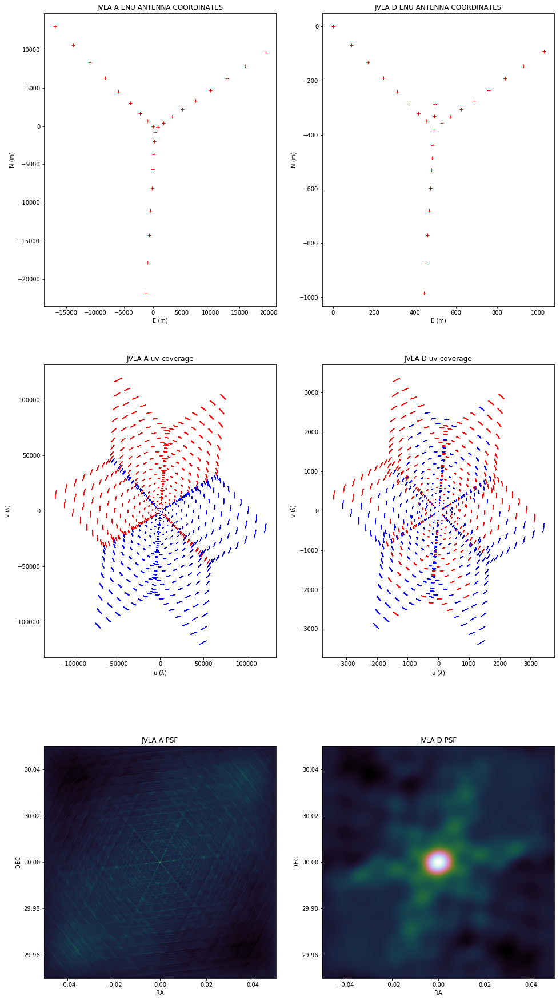

In [71]:
#Globals file with JVLA A-configuration antenna ENU coordinates
%run jvla_a_constants.py
DECLINATION = 30.0
RA = 0.0
fig = plt.figure(figsize=(16, 32))
ax=fig.add_subplot(321)
ax.set_title("JVLA A ENU ANTENNA COORDINATES")
ax.plot(ENU[:,0],
           ENU[:,1],
           'r+')
ax.set_xlabel("E (m)")
ax.set_ylabel("N (m)")
vla_a_uvw = track_simulator.sim_uv(RA, DECLINATION, 0.5, 60/3600.0, ENU, ARRAY_LATITUDE)
#Globals file with JVLA D-configuration antenna ENU coordinates
%run jvla_d_constants.py
ax=fig.add_subplot(322)
ax.set_title("JVLA D ENU ANTENNA COORDINATES")
ax.plot(ENU[:,0],
        ENU[:,1],
        'r+')
ax.set_xlabel("E (m)")
ax.set_ylabel("N (m)")
vla_d_uvw = track_simulator.sim_uv(RA, DECLINATION, 0.5, 60/3600.0, ENU, ARRAY_LATITUDE)
ax=fig.add_subplot(323)
ax.set_title("JVLA A uv-coverage")
ax.plot(vla_a_uvw[:,0]/CENTRE_CHANNEL,
           vla_a_uvw[:,1]/CENTRE_CHANNEL,
           'r+',markersize=1)
ax.plot(-vla_a_uvw[:,0]/CENTRE_CHANNEL,
           -vla_a_uvw[:,1]/CENTRE_CHANNEL,
           'b+',markersize=1)
ax.set_xlabel("u ($\lambda$)")
ax.set_ylabel("v ($\lambda$)")
ax=fig.add_subplot(324)
ax.set_title("JVLA D uv-coverage")
ax.plot(vla_d_uvw[:,0]/CENTRE_CHANNEL,
           vla_d_uvw[:,1]/CENTRE_CHANNEL,
           'r+',markersize=1)
ax.plot(-vla_d_uvw[:,0]/CENTRE_CHANNEL,
           -vla_d_uvw[:,1]/CENTRE_CHANNEL,
           'b+',markersize=1)
ax.set_xlabel("u ($\lambda$)")
ax.set_ylabel("v ($\lambda$)")

# more about the next bit in the gridding section:
IM_SIZE_DEGREES = 0.1
scale = np.deg2rad(IM_SIZE_DEGREES)

tabulated_filter = AA_filter(3,63,"sinc")
dirty_sky_vla_a, psf_vla_a = grid_ifft(np.ones([vla_a_uvw.shape[0],1,1], dtype=np.complex64),
                                       vla_a_uvw[:,0:2] * scale,
                                       np.array([CENTRE_CHANNEL]),
                                       2048,2048,
                                       tabulated_filter)
dirty_sky_vla_d, psf_vla_d = grid_ifft(np.ones([vla_d_uvw.shape[0],1,1], dtype=np.complex64),
                                       vla_d_uvw[:,0:2] * scale,
                                       np.array([CENTRE_CHANNEL]),
                                       2048,2048,
                                       tabulated_filter)
ax=fig.add_subplot(325)
ax.set_title("JVLA A PSF")
ax.imshow(np.real(psf_vla_a),
          cmap="cubehelix",
          extent=[RA - IM_SIZE_DEGREES/2,
                  RA + IM_SIZE_DEGREES/2,
                  DECLINATION - IM_SIZE_DEGREES/2,
                  DECLINATION + IM_SIZE_DEGREES/2])
ax.set_xlabel("RA")
ax.set_ylabel("DEC")
ax=fig.add_subplot(326)
ax.set_title("JVLA D PSF")
ax.imshow(np.real(psf_vla_d),
          cmap="cubehelix",
          extent=[RA - IM_SIZE_DEGREES/2,
                  RA + IM_SIZE_DEGREES/2,
                  DECLINATION - IM_SIZE_DEGREES/2,
                  DECLINATION + IM_SIZE_DEGREES/2])
ax.set_xlabel("RA")
ax.set_ylabel("DEC")
plt.show()

图：

*Figure: The sampling functions and PSFs of the VLA in L-Band (1 GHz). To the left the fully extended JVLA A configuration is plotted and to the right the fully retracted D configuration is plotted for a 30min observation.*

### 5.2.7 Conclusion

To summarize this section the following figure illustrates the most important properties of sampling function coverage.

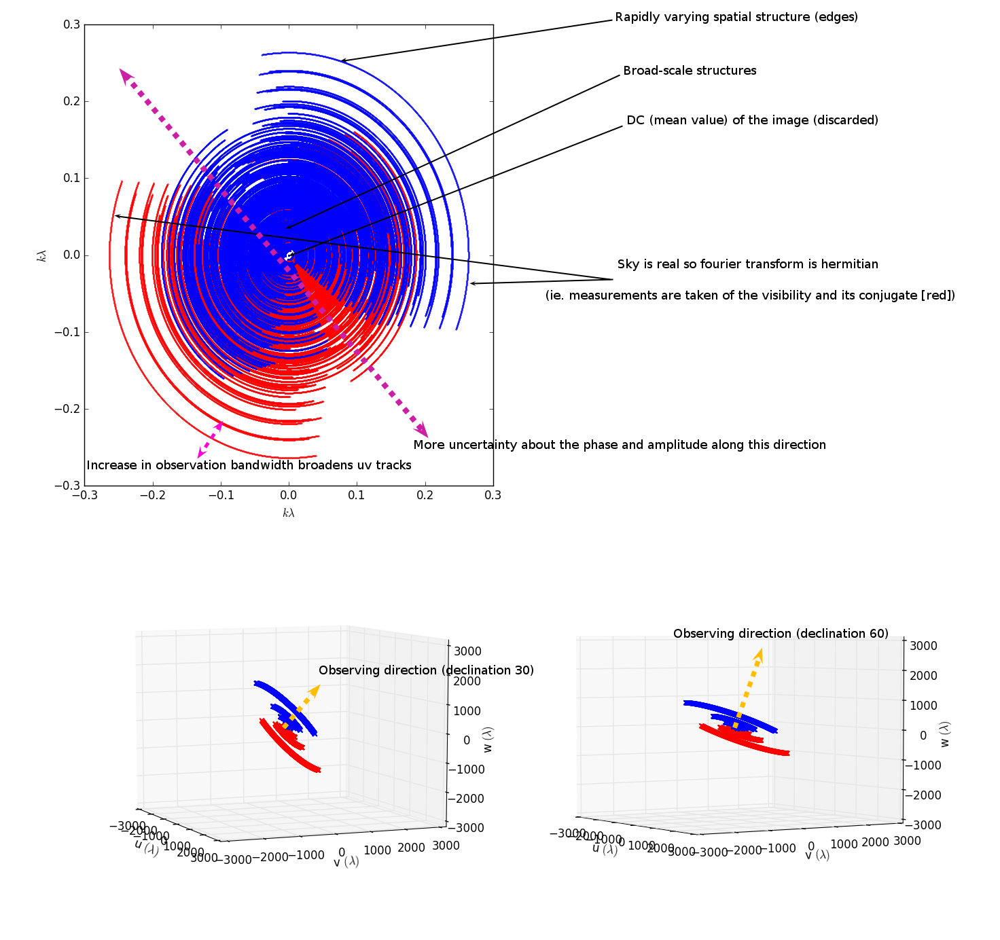

In [72]:
Image(filename='figures/uv_coverage_summary.png')

*Figure: Summary of some of the most important properties of uv coverage (WSRT 96m layout). Top is the projected uv coverage at 90 degrees. Bottom is the uv coverage at 30 and 60 degrees respectively.*

Up until now we have been creating sampling functions by selecting pixels in an image, that is, we have been picking sampling fuctions which are on a regular grid. But, in interferometry the baselines are (almost) never on a grid, the individual baseline tracks are sampled at a given time and not a given position, this leads to a irregular sampling of the visibility domain. An image can be constructed out of these non-uniformly placed samples with a standard Fourier Transform, but that is a computationally slow method. If the samples are on a grid, a fast Fourier Transform method can be used, which greatly decreases the computational load. In order to take advantage of this improvement a 'gridding' step is performed on the visibility samples. This is covered in the next section along with its complimentary process of degridding which is required for many modern deconvolution methods.

***

Next: [5.3 Gridding and Degridding for using the FFT](5_3_gridding_and_degridding.ipynb)